# This is the exerice for IDS group to perform Web scrapping 
### Group Member Names - Piyush Jadhav. Abhijeet Srivastava, Abhishek Buchake. 

### this execrice is to scrap the BigBasket website for three different types of categories.



### Below cell is to import or install all the required libraries for the execution

In [4]:
import requests
from bs4 import BeautifulSoup
from selenium import webdriver
import pandas as pd
from csv import DictWriter
import time

In [ ]:
Grocery_Name_list = []
Brand_Name_list = []
Discount_Price_list = []
MRP_Price_list = [] 
Quantity_list = []

# Initialize WebDriver
driver = webdriver.Chrome()  # You should replace this with the appropriate web driver you're using (Chrome, Firefox, etc.)

# Open the URL of the webpage
url = "https://www.bigbasket.com/cl/foodgrains-oil-masala"
driver.get(url)
driver.implicitly_wait(5)
# Automatically scroll the page
scroll_pause_time = 3  # Pause between each scroll
screen_height = driver.execute_script("return window.screen.height;")  # Browser window height
i = 1
scroll = 1
while True:
    # Scroll down
    driver.execute_script(f"window.scrollTo(0, {screen_height * i});")
    i += 2
    time.sleep(scroll_pause_time)
    scroll = scroll + 1
    print('scroll:',scroll)

    # Check if reaching the end of the page
    scroll_height = driver.execute_script("return document.body.scrollHeight;")
    if screen_height * i > scroll_height or scroll == 120:
        break

# Fetch the data using BeautifulSoup after all data is loaded

soup = BeautifulSoup(driver.page_source, "html.parser")
#print(soup)
prettyf = open("BB_foodgrains-oil-masala.txt", "wb")
prettyf.write(soup.prettify().encode("utf-8"))
print("written to BB_foodgrains-oil-masala.txt")

driver.close()

<html class="scroll-smooth" lang="en">
<head>
<meta content="Az520Inasey3TAyqLyojQa8MnmCALSEU29yQFW8dePZ7xQTvSt73pHazLFTK5f7SyLUJSo2uKLesEtEa9aUYcgMAAACPeyJvcmlnaW4iOiJodHRwczovL2dvb2dsZS5jb206NDQzIiwiZmVhdHVyZSI6IkRpc2FibGVUaGlyZFBhcnR5U3RvcmFnZVBhcnRpdGlvbmluZyIsImV4cGlyeSI6MTcyNTQwNzk5OSwiaXNTdWJkb21haW4iOnRydWUsImlzVGhpcmRQYXJ0eSI6dHJ1ZX0=" http-equiv="origin-trial"/>
<meta charset="utf-8"/>
<meta content="width=device-width" name="viewport"/>
<title>
   Buy Grains,Oil &amp; Masalas Online In India at Great Prices|Free Shipping  - bigbasket
  </title>
<meta content="Only shop which sells foodgrains, oil &amp; masala online.Find all types of oil online.Buy Grocery staples from online food market in India &amp; get free home delivery " name="description"/>
<meta content="staple food, staples india online, groceries online, staples online, staples in india, staple foods, staples online shopping, food staples" name="keywords"/>
<link href="https://www.bigbasket.com/cl/foodgrains-oil-ma
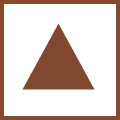

In [2]:
from bs4 import BeautifulSoup

# Open the .txt file and read its content
with open('BB_foodgrains-oil-masala_22Nov.txt', 'r', encoding='utf-8') as file:
    content = file.read()

# Parse the content using Beautiful Soup
soup = BeautifulSoup(content, 'html.parser')
#soup

# Now you can use Beautiful Soup methods to navigate and extract information from the parsed content
# For example, let's print all the text content within the <p> tags
#for paragraph in soup.find_all('SKUDeck___StyledDiv'):
#    print(paragraph.get_text())

In [11]:
Grocery_Name_list = []
Brand_Name_list = []
Discount_Price_list = []
MRP_Price_list = [] 
Quantity_list = []
Rating_list = []

skulist =soup.find_all(class_="SKUDeck___StyledDiv-sc-1e5d9gk-0 eA-dmzP") 
for sku in skulist:
    sp = sku.find_all(class_='block m-0 line-clamp-2 font-regular text-base leading-sm text-darkOnyx-800 pt-0.5 h-full')
    #print(sp)
 
    for h in sp:
        Grocery_Name = h.get_text().strip()
        print("Grocery_Name=",Grocery_Name)
        Grocery_Name_list.append(Grocery_Name)
        
        discountlist = sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel-sc-pldi2d-1 gJxZPQ AypOi')
        Discount_Price=0
        for dis in discountlist:
            Discount_Price = dis.get_text().strip()
            print('Discount_Price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        if Discount_Price == 0:
            print('Discount_price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        
        MRP_Price=0
        MRPlist= sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel2-sc-pldi2d-2 gJxZPQ hsCgvu')
        for mrp in MRPlist:
            MRP_Price = mrp.get_text().strip()
            print('MRP_Price=',MRP_Price)
            MRP_Price_list.append(MRP_Price)
        if MRP_Price == 0:
            print('MRP_Price=',Discount_Price)
            MRP_Price_list.append(Discount_Price)
            
        Rating=0
        Ratinglist= sku.find_all(class_="Label-sc-15v1nk5-0 gJxZPQ")
        for Ratings in Ratinglist:
            Rating = Ratings.get_text().strip()
        print('Rating=',Rating)
        Rating_list.append(Rating)
        
        BrandList= sku.find_all(class_="Label-sc-15v1nk5-0 BrandName___StyledLabel2-sc-hssfrl-1 gJxZPQ keQNWn")
        for Brand in BrandList:
            Brand_Name = Brand.get_text().strip()
            print('Brand_Name=',Brand_Name)
            Brand_Name_list.append(Brand_Name)
        
        QuantityListML= sku.find_all(class_="Label-sc-15v1nk5-0 PackSelector___StyledLabel-sc-1lmu4hv-0 gJxZPQ fnsuXg")
        for QuantML in QuantityListML:
            Quantity = QuantML.get_text().strip()
            #Quantity_KG = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_KG_list.append(Quantity_KG)
                
        QuantityListKg= sku.find_all(class_="Label-sc-15v1nk5-0 PackChanger___StyledLabel-sc-newjpv-1 gJxZPQ cWbtUx")
        for QuantKg in QuantityListKg:
            Quantity = QuantKg.get_text().strip()
            #Quantity_ML = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_ML_list.append(Quantity_ML)
        
              
        print("list_Quantity_list",len(Quantity_list), "\nMRP_Price_list:",len(MRP_Price_list), "\nDiscount_Price:",len(Discount_Price_list)
             ,'\nBrand_Name_list:',len(Brand_Name_list),'\nGrocery_Name_list:',len(Grocery_Name_list),'\nRating_list:',len(Rating_list))
     
        print('\n')

#driver.close()
# Close the file object
dict = {'Grocery_Name': Grocery_Name_list, 'Brand_Name': Brand_Name_list, 'Rating': Rating_list, 'Discount_Price': Discount_Price_list, 'MRP_Price': MRP_Price_list, 
        'Quantity': Quantity_list}
              
df = pd.DataFrame(dict)
#print("df dict:",df)
 # saving the dataframe
df.to_csv('BB_foodgrains-oil-masala_27Nov.csv')
#prettyf.close()

Grocery_Name= Premium Panchmewa Superfood Farmley Jar
Discount_Price= ₹415.2
MRP_Price= ₹519
Rating= 4.3
Brand_Name= Farmley
Quantity= 450 gm - Jar
list_Quantity_list 1 
MRP_Price_list: 1 
Discount_Price: 1 
Brand_Name_list: 1 
Grocery_Name_list: 1 
Rating_list: 1


Grocery_Name= Atta/Godihittu - Whole Wheat
Discount_Price= ₹226.92
MRP_Price= ₹294
Rating= 4.1
Brand_Name= Aashirvaad
Quantity= 5 kg
list_Quantity_list 2 
MRP_Price_list: 2 
Discount_Price: 2 
Brand_Name_list: 2 
Grocery_Name_list: 2 
Rating_list: 2


Grocery_Name= Moong Chilka
Discount_Price= ₹158.65
MRP_Price= ₹167
Rating= 3
Brand_Name= AHAAR
Quantity= 500 g
list_Quantity_list 3 
MRP_Price_list: 3 
Discount_Price: 3 
Brand_Name_list: 3 
Grocery_Name_list: 3 
Rating_list: 3


Grocery_Name= Pure Ghee
Discount_Price= ₹1300
MRP_Price= ₹1300
Rating= 4.1
Brand_Name= Nandini
Quantity= 2 x 1 L - Multipack
list_Quantity_list 4 
MRP_Price_list: 4 
Discount_Price: 4 
Brand_Name_list: 4 
Grocery_Name_list: 4 
Rating_list: 4


Grocery

Rating= 4.1
Brand_Name= Fortune
Quantity= 3x1 L - Multipack
list_Quantity_list 41 
MRP_Price_list: 41 
Discount_Price: 41 
Brand_Name_list: 41 
Grocery_Name_list: 41 
Rating_list: 41


Grocery_Name= Urad Gota - Desi, Unpolished Mature Pulses For Easy Cooking & Rich Flavour
Discount_Price= ₹159
MRP_Price= ₹210
Rating= 4
Brand_Name= BB Royal
Quantity= 1 kg - Pouch
list_Quantity_list 42 
MRP_Price_list: 42 
Discount_Price: 42 
Brand_Name_list: 42 
Grocery_Name_list: 42 
Rating_list: 42


Grocery_Name= Poha/Avalakki/Aval - Thick
Discount_Price= ₹66
MRP_Price= ₹100
Rating= 0
Brand_Name= BB Royal
Quantity= 1 kg - Pouch
list_Quantity_list 43 
MRP_Price_list: 43 
Discount_Price: 43 
Brand_Name_list: 43 
Grocery_Name_list: 43 
Rating_list: 43


Grocery_Name= Green Moong Whole - Desi, Unpolished Mature Pulses For Easy Cooking & Rich Flavour
Discount_Price= ₹63.46
MRP_Price= ₹90
Rating= 4
Brand_Name= BB Royal
Quantity= 500 g - Pouch
list_Quantity_list 44 
MRP_Price_list: 44 
Discount_Price: 44 
B

Grocery_Name= Gold - Refined Cooking Oil, Blend Of Rice Bran & Sunflower Oil, Helps Keeps Heart Healthy
Discount_Price= ₹499
MRP_Price= ₹675
Rating= 4
Brand_Name= Saffola
Quantity= 3 L - Jar
list_Quantity_list 86 
MRP_Price_list: 86 
Discount_Price: 86 
Brand_Name_list: 86 
Grocery_Name_list: 86 
Rating_list: 86


Grocery_Name= Cashew/Kaju - Whole
Discount_Price= ₹754
MRP_Price= ₹1000
Rating= 3.9
Brand_Name= Super Saver
Quantity= 1 kg
list_Quantity_list 87 
MRP_Price_list: 87 
Discount_Price: 87 
Brand_Name_list: 87 
Grocery_Name_list: 87 
Rating_list: 87


Grocery_Name= Iodised Crystal Salt
Discount_Price= ₹44
MRP_Price= ₹44
Rating= 4.2
Brand_Name= Tata Salt
Quantity= 2x1kg - Multipack
list_Quantity_list 88 
MRP_Price_list: 88 
Discount_Price: 88 
Brand_Name_list: 88 
Grocery_Name_list: 88 
Rating_list: 88


Grocery_Name= Chiroti/Barik Sooji
Discount_Price= ₹56
MRP_Price= ₹65
Rating= 0
Brand_Name= BB Royal
Quantity= 1 kg - Pouch
list_Quantity_list 89 
MRP_Price_list: 89 
Discount_Pric

Rating= 3.8
Brand_Name= Fresho Organic
Quantity= 2x1 L - (Multipack)
list_Quantity_list 139 
MRP_Price_list: 139 
Discount_Price: 139 
Brand_Name_list: 139 
Grocery_Name_list: 139 
Rating_list: 139


Grocery_Name= Organic - Chana Brown/Kadale Kaalu
Discount_Price= ₹30
MRP_Price= ₹33
Rating= 4
Brand_Name= BB Royal
Quantity= 200 g
list_Quantity_list 140 
MRP_Price_list: 140 
Discount_Price: 140 
Brand_Name_list: 140 
Grocery_Name_list: 140 
Rating_list: 140


Grocery_Name= Rock Salt/Uppu
Discount_Price= ₹88.8
MRP_Price= ₹120
Rating= 4.2
Brand_Name= Tata Salt
Quantity= 1 kg - Pouch
list_Quantity_list 141 
MRP_Price_list: 141 
Discount_Price: 141 
Brand_Name_list: 141 
Grocery_Name_list: 141 
Rating_list: 141


Grocery_Name= Dates/Kharjura - Deseeded
Discount_Price= ₹149
MRP_Price= ₹149
Rating= 4
Brand_Name= Lion
Quantity= 500 g - Cup
list_Quantity_list 142 
MRP_Price_list: 142 
Discount_Price: 142 
Brand_Name_list: 142 
Grocery_Name_list: 142 
Rating_list: 142


Grocery_Name= Jeera/Jeerig

Brand_Name= AKSHAYAKALPA
Quantity= 490 ml
list_Quantity_list 183 
MRP_Price_list: 183 
Discount_Price: 183 
Brand_Name_list: 183 
Grocery_Name_list: 183 
Rating_list: 183


Grocery_Name= Idli Sooji/Rava
Discount_Price= ₹47
MRP_Price= ₹60
Rating= 0
Brand_Name= BB Royal
Quantity= 1 kg - Pouch
list_Quantity_list 184 
MRP_Price_list: 184 
Discount_Price: 184 
Brand_Name_list: 184 
Grocery_Name_list: 184 
Rating_list: 184


Grocery_Name= Coconad - Pure Coconut Oil
Discount_Price= ₹175.75
MRP_Price= ₹185
Rating= 4.2
Brand_Name= Klf
Quantity= 1 L
list_Quantity_list 185 
MRP_Price_list: 185 
Discount_Price: 185 
Brand_Name_list: 185 
Grocery_Name_list: 185 
Rating_list: 185


Grocery_Name= Organic - Maida
Discount_Price= ₹116
MRP_Price= ₹170
Rating= 4
Brand_Name= BB Royal
Quantity= 2x1 kg - (Multipack)
list_Quantity_list 186 
MRP_Price_list: 186 
Discount_Price: 186 
Brand_Name_list: 186 
Grocery_Name_list: 186 
Rating_list: 186


Grocery_Name= Coriander Powder
Discount_Price= ₹131.75
MRP_Pric

Quantity= 500 g
list_Quantity_list 225 
MRP_Price_list: 225 
Discount_Price: 225 
Brand_Name_list: 225 
Grocery_Name_list: 225 
Rating_list: 225


Grocery_Name= Organic - Foxtail Millet / Italian, Thinai Rice
Discount_Price= ₹62
MRP_Price= ₹72
Rating= 4
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 226 
MRP_Price_list: 226 
Discount_Price: 226 
Brand_Name_list: 226 
Grocery_Name_list: 226 
Rating_list: 226


Grocery_Name= Organic Walnut/Akrodu Kernels
Discount_Price= ₹860
MRP_Price= ₹1099
Rating= 3.5
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 227 
MRP_Price_list: 227 
Discount_Price: 227 
Brand_Name_list: 227 
Grocery_Name_list: 227 
Rating_list: 227


Grocery_Name= Whole Wheat Atta
Discount_Price= ₹651.9
MRP_Price= ₹930
Rating= 4
Brand_Name= 24 Mantra Organic
Quantity= 3x5 kg - Multipack
list_Quantity_list 228 
MRP_Price_list: 228 
Discount_Price: 228 
Brand_Name_list: 228 
Grocery_Name_list: 228 
Rating_list: 228


Grocery_Name= Rajma/Capparadavare - White/Chit

Rating= 3.6
Brand_Name= BB Royal
Quantity= 200 g - Vacuum Packed
list_Quantity_list 280 
MRP_Price_list: 280 
Discount_Price: 280 
Brand_Name_list: 280 
Grocery_Name_list: 280 
Rating_list: 280


Grocery_Name= Schezwan Fried Rice Masala
Discount_Price= ₹100
MRP_Price= ₹100
Rating= 4.2
Brand_Name= Chings
Quantity= 10 x 20 g - Multipack
list_Quantity_list 281 
MRP_Price_list: 281 
Discount_Price: 281 
Brand_Name_list: 281 
Grocery_Name_list: 281 
Rating_list: 281


Grocery_Name= Refined - Sunflower Oil
Discount_Price= ₹577.5
MRP_Price= ₹725
Rating= 4.2
Brand_Name= Dhara
Quantity= 5 L - Can
list_Quantity_list 282 
MRP_Price_list: 282 
Discount_Price: 282 
Brand_Name_list: 282 
Grocery_Name_list: 282 
Rating_list: 282


Grocery_Name= Coriander Seeds/Kottambari Beeja
Discount_Price= ₹49
MRP_Price= ₹80
Rating= 3.9
Brand_Name= BB Popular
Quantity= 200 g
list_Quantity_list 283 
MRP_Price_list: 283 
Discount_Price: 283 
Brand_Name_list: 283 
Grocery_Name_list: 283 
Rating_list: 283


Grocery_Na

Grocery_Name= Organic - Poha
Discount_Price= ₹164
MRP_Price= ₹238
Rating= 0
Brand_Name= BB Royal
Quantity= 2x1 kg - Multipack
list_Quantity_list 328 
MRP_Price_list: 328 
Discount_Price: 328 
Brand_Name_list: 328 
Grocery_Name_list: 328 
Rating_list: 328


Grocery_Name= Dal Powder/Paruppu Podi - Rich In Taste & Flavour
Discount_Price= ₹40
MRP_Price= ₹60
Rating= 3.8
Brand_Name= BB Royal
Quantity= 100 g
list_Quantity_list 329 
MRP_Price_list: 329 
Discount_Price: 329 
Brand_Name_list: 329 
Grocery_Name_list: 329 
Rating_list: 329


Grocery_Name= Chana - Kabuli/Kabuli Kadale
Discount_Price= ₹49
MRP_Price= ₹58
Rating= 0
Brand_Name= BB Royal
Quantity= 200 g - Pouch
list_Quantity_list 330 
MRP_Price_list: 330 
Discount_Price: 330 
Brand_Name_list: 330 
Grocery_Name_list: 330 
Rating_list: 330


Grocery_Name= A2 Desi Cow Ghee
Discount_Price= ₹699
MRP_Price= ₹1500
Rating= 0
Brand_Name= Fresho Organic
Quantity= 500 ml
list_Quantity_list 331 
MRP_Price_list: 331 
Discount_Price: 331 
Brand_Name_

Rating= 3.8
Brand_Name= BB Royal
Quantity= 5 kg - Bag
list_Quantity_list 376 
MRP_Price_list: 376 
Discount_Price: 376 
Brand_Name_list: 376 
Grocery_Name_list: 376 
Rating_list: 376


Grocery_Name= Oil - Primio Refined Groundnut
Discount_Price= ₹1275
MRP_Price= ₹1275
Rating= 5
Brand_Name= Rro
Quantity= 5 L - Can
list_Quantity_list 377 
MRP_Price_list: 377 
Discount_Price: 377 
Brand_Name_list: 377 
Grocery_Name_list: 377 
Rating_list: 377


Grocery_Name= Green Moong Whole/Sabut
Discount_Price= ₹75
MRP_Price= ₹85
Rating= 4
Brand_Name= BB Popular
Quantity= 500 g - Pouch
list_Quantity_list 378 
MRP_Price_list: 378 
Discount_Price: 378 
Brand_Name_list: 378 
Grocery_Name_list: 378 
Rating_list: 378


Grocery_Name= Pista - Irani, Roasted & Salted
Discount_Price= ₹917
MRP_Price= ₹1250
Rating= 0
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 379 
MRP_Price_list: 379 
Discount_Price: 379 
Brand_Name_list: 379 
Grocery_Name_list: 379 
Rating_list: 379


Grocery_Name= Ponni Raw - Rice 

Rating= 4.2
Brand_Name= Double Horse
Quantity= 500 g - Pouch
list_Quantity_list 423 
MRP_Price_list: 423 
Discount_Price: 423 
Brand_Name_list: 423 
Grocery_Name_list: 423 
Rating_list: 423


Grocery_Name= Coriander/Dhania Powder
Discount_Price= ₹116
MRP_Price= ₹200
Rating= 4
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 424 
MRP_Price_list: 424 
Discount_Price: 424 
Brand_Name_list: 424 
Grocery_Name_list: 424 
Rating_list: 424


Grocery_Name= Cumin/Jeera - Whole
Discount_Price= ₹392
MRP_Price= ₹500
Rating= 4.2
Brand_Name= Super Saver
Quantity= 500 g
list_Quantity_list 425 
MRP_Price_list: 425 
Discount_Price: 425 
Brand_Name_list: 425 
Grocery_Name_list: 425 
Rating_list: 425


Grocery_Name= Masoor Black, Whole
Discount_Price= ₹26
MRP_Price= ₹35
Rating= 3.9
Brand_Name= BB Royal
Quantity= 200 g - Pouch
list_Quantity_list 426 
MRP_Price_list: 426 
Discount_Price: 426 
Brand_Name_list: 426 
Grocery_Name_list: 426 
Rating_list: 426


Grocery_Name= Oil - Mustard (Kachi Ghani)
Di

Rating= 4.2
Brand_Name= Everest
Quantity= 100 g - Pouch
list_Quantity_list 454 
MRP_Price_list: 454 
Discount_Price: 454 
Brand_Name_list: 454 
Grocery_Name_list: 454 
Rating_list: 454


Grocery_Name= 100% Natural & Pure Gingelly Oil - Unrefined, Cold-Pressed
Discount_Price= ₹437
MRP_Price= ₹460
Rating= 4.1
Brand_Name= Nature Way
Quantity= 1 L
list_Quantity_list 455 
MRP_Price_list: 455 
Discount_Price: 455 
Brand_Name_list: 455 
Grocery_Name_list: 455 
Rating_list: 455


Grocery_Name= Raw Rice/Akki - Kolam
Discount_Price= ₹359
MRP_Price= ₹400
Rating= 3.6
Brand_Name= BB Royal
Quantity= 5 kg - Bag
list_Quantity_list 456 
MRP_Price_list: 456 
Discount_Price: 456 
Brand_Name_list: 456 
Grocery_Name_list: 456 
Rating_list: 456


Grocery_Name= Soya - Chunks
Discount_Price= ₹156.22
MRP_Price= ₹210
Rating= 4.2
Brand_Name= Nutrela
Quantity= 1 kg - 0
list_Quantity_list 457 
MRP_Price_list: 457 
Discount_Price: 457 
Brand_Name_list: 457 
Grocery_Name_list: 457 
Rating_list: 457


Grocery_Name= B

Grocery_Name= Asafoetida - Special
Discount_Price= ₹442
MRP_Price= ₹442
Rating= 4.4
Brand_Name= Ssp
Quantity= 10 g - Jar
list_Quantity_list 503 
MRP_Price_list: 503 
Discount_Price: 503 
Brand_Name_list: 503 
Grocery_Name_list: 503 
Rating_list: 503


Grocery_Name= S&J Pasta Masala
Discount_Price= ₹5
MRP_Price= ₹5
Rating= 4.2
Brand_Name= Smith & Jones
Quantity= 7g - Pouch
list_Quantity_list 504 
MRP_Price_list: 504 
Discount_Price: 504 
Brand_Name_list: 504 
Grocery_Name_list: 504 
Rating_list: 504


Grocery_Name= Unpolished Kala Chana
Discount_Price= ₹111
MRP_Price= ₹149
Rating= 4
Brand_Name= Tata Sampann
Quantity= 1 kg - Pouch
list_Quantity_list 505 
MRP_Price_list: 505 
Discount_Price: 505 
Brand_Name_list: 505 
Grocery_Name_list: 505 
Rating_list: 505


Grocery_Name= Groundnut
Discount_Price= ₹125.16
MRP_Price= ₹149
Rating= 3.9
Brand_Name= Safe Harvest
Quantity= 500 g
list_Quantity_list 506 
MRP_Price_list: 506 
Discount_Price: 506 
Brand_Name_list: 506 
Grocery_Name_list: 506 
Rat

Quantity= 10 kg
list_Quantity_list 559 
MRP_Price_list: 559 
Discount_Price: 559 
Brand_Name_list: 559 
Grocery_Name_list: 559 
Rating_list: 559


Grocery_Name= Extra Light Olive Oil
Discount_Price= ₹672.14
MRP_Price= ₹1095
Rating= 4.4
Brand_Name= Disano
Quantity= 500 ml
list_Quantity_list 560 
MRP_Price_list: 560 
Discount_Price: 560 
Brand_Name_list: 560 
Grocery_Name_list: 560 
Rating_list: 560


Grocery_Name= 100% Natural Premium Whole Cashews - Value Pack
Discount_Price= ₹992
MRP_Price= ₹1550
Rating= 3.6
Brand_Name= Happilo
Quantity= 1 kg
list_Quantity_list 561 
MRP_Price_list: 561 
Discount_Price: 561 
Brand_Name_list: 561 
Grocery_Name_list: 561 
Rating_list: 561


Grocery_Name= Chilli - Cherry/Gundu With Stem
Discount_Price= ₹315
MRP_Price= ₹500
Rating= 3.9
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 562 
MRP_Price_list: 562 
Discount_Price: 562 
Brand_Name_list: 562 
Grocery_Name_list: 562 
Rating_list: 562


Grocery_Name= Groundnut Oil
Discount_Price= ₹409.04
MRP_

Discount_Price= ₹120.28
MRP_Price= ₹124
Rating= 3.9
Brand_Name= Tata Sampann
Quantity= 500 g
list_Quantity_list 600 
MRP_Price_list: 600 
Discount_Price: 600 
Brand_Name_list: 600 
Grocery_Name_list: 600 
Rating_list: 600


Grocery_Name= Tur Dal
Discount_Price= ₹202.5
MRP_Price= ₹225
Rating= 4
Brand_Name= Safe Harvest
Quantity= 1 kg
list_Quantity_list 601 
MRP_Price_list: 601 
Discount_Price: 601 
Brand_Name_list: 601 
Grocery_Name_list: 601 
Rating_list: 601


Grocery_Name= Organic Khapli Wheat/Emmer Flour - 100% Natural
Discount_Price= ₹175
MRP_Price= ₹245
Rating= 4.2
Brand_Name= Jiwa
Quantity= 1 kg
list_Quantity_list 602 
MRP_Price_list: 602 
Discount_Price: 602 
Brand_Name_list: 602 
Grocery_Name_list: 602 
Rating_list: 602


Grocery_Name= Saunf/Sompu - Sweet
Discount_Price= ₹37
MRP_Price= ₹38
Rating= 4.3
Brand_Name= Top
Quantity= 100 g - Pouch
list_Quantity_list 603 
MRP_Price_list: 603 
Discount_Price: 603 
Brand_Name_list: 603 
Grocery_Name_list: 603 
Rating_list: 603


Grocery_

Rating= 4.1
Brand_Name= BB Royal
Quantity= 500 g - Pouch
list_Quantity_list 646 
MRP_Price_list: 646 
Discount_Price: 646 
Brand_Name_list: 646 
Grocery_Name_list: 646 
Rating_list: 646


Grocery_Name= Urad Dal White Whole
Discount_Price= ₹409.2
MRP_Price= ₹465
Rating= 4
Brand_Name= 24 Mantra Organic
Quantity= 3x500 g - Multipack
list_Quantity_list 647 
MRP_Price_list: 647 
Discount_Price: 647 
Brand_Name_list: 647 
Grocery_Name_list: 647 
Rating_list: 647


Grocery_Name= Organic - Maize flour/Makka Atta
Discount_Price= ₹75
MRP_Price= ₹89
Rating= 0
Brand_Name= BB Royal
Quantity= 1 kg
list_Quantity_list 648 
MRP_Price_list: 648 
Discount_Price: 648 
Brand_Name_list: 648 
Grocery_Name_list: 648 
Rating_list: 648


Grocery_Name= Extra Virgin Olive Oil
Discount_Price= ₹1159
MRP_Price= ₹1799
Rating= 4.2
Brand_Name= La Espanola
Quantity= 1 L - Glass Bottle
list_Quantity_list 649 
MRP_Price_list: 649 
Discount_Price: 649 
Brand_Name_list: 649 
Grocery_Name_list: 649 
Rating_list: 649


Grocer

Rating= 4.3
Brand_Name= 24 Mantra Organic
Quantity= 5x1 kg - Multipack
list_Quantity_list 699 
MRP_Price_list: 699 
Discount_Price: 699 
Brand_Name_list: 699 
Grocery_Name_list: 699 
Rating_list: 699


Grocery_Name= Dates/Kharjura - Red
Discount_Price= ₹130
MRP_Price= ₹300
Rating= 3.3
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 700 
MRP_Price_list: 700 
Discount_Price: 700 
Brand_Name_list: 700 
Grocery_Name_list: 700 
Rating_list: 700


Grocery_Name= Masala - Shahi Biryani
Discount_Price= ₹332
MRP_Price= ₹332
Rating= 4.3
Brand_Name= Everest
Quantity= 200 g
list_Quantity_list 701 
MRP_Price_list: 701 
Discount_Price: 701 
Brand_Name_list: 701 
Grocery_Name_list: 701 
Rating_list: 701


Grocery_Name= Hing
Discount_Price= ₹110
MRP_Price= ₹110
Rating= 4.1
Brand_Name= Mdh
Quantity= 10 g - Carton
list_Quantity_list 702 
MRP_Price_list: 702 
Discount_Price: 702 
Brand_Name_list: 702 
Grocery_Name_list: 702 
Rating_list: 702


Grocery_Name= Olive Oil- Pure Olive Oil- Ideal for Ind

Rating= 4.1
Brand_Name= Organic Tattva
Quantity= 100 g - Pouch
list_Quantity_list 757 
MRP_Price_list: 757 
Discount_Price: 757 
Brand_Name_list: 757 
Grocery_Name_list: 757 
Rating_list: 757


Grocery_Name= Organic Moong Dal/Hesaru Bele
Discount_Price= ₹266
MRP_Price= ₹280
Rating= 4.3
Brand_Name= Tata Sampann
Quantity= 1 kg
list_Quantity_list 758 
MRP_Price_list: 758 
Discount_Price: 758 
Brand_Name_list: 758 
Grocery_Name_list: 758 
Rating_list: 758


Grocery_Name= Organic - Coriander Powder
Discount_Price= ₹120
MRP_Price= ₹149
Rating= 4
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 759 
MRP_Price_list: 759 
Discount_Price: 759 
Brand_Name_list: 759 
Grocery_Name_list: 759 
Rating_list: 759


Grocery_Name= Bajra Flour
Discount_Price= ₹69
MRP_Price= ₹100
Rating= 3.8
Brand_Name= BB Royal
Quantity= 1 kg
list_Quantity_list 760 
MRP_Price_list: 760 
Discount_Price: 760 
Brand_Name_list: 760 
Grocery_Name_list: 760 
Rating_list: 760


Grocery_Name= Jeera/Jeerige - Pesticide Free


Rating= 4.1
Brand_Name= Catch
Quantity= 100 g - Plastic Bottle
list_Quantity_list 797 
MRP_Price_list: 797 
Discount_Price: 797 
Brand_Name_list: 797 
Grocery_Name_list: 797 
Rating_list: 797


Grocery_Name= Organic - Garlic Powder - Dehydrated
Discount_Price= ₹18
MRP_Price= ₹29
Rating= 3.9
Brand_Name= BB Royal
Quantity= 50 g
list_Quantity_list 798 
MRP_Price_list: 798 
Discount_Price: 798 
Brand_Name_list: 798 
Grocery_Name_list: 798 
Rating_list: 798


Grocery_Name= Masoor Malka/Red Whole
Discount_Price= ₹230
MRP_Price= ₹320
Rating= 0
Brand_Name= BB Royal
Quantity= 2 kg
list_Quantity_list 799 
MRP_Price_list: 799 
Discount_Price: 799 
Brand_Name_list: 799 
Grocery_Name_list: 799 
Rating_list: 799


Grocery_Name= Pani Puri Masala
Discount_Price= ₹40
MRP_Price= ₹40
Rating= 4.2
Brand_Name= Everest
Quantity= 50 g - Carton
list_Quantity_list 800 
MRP_Price_list: 800 
Discount_Price: 800 
Brand_Name_list: 800 
Grocery_Name_list: 800 
Rating_list: 800


Grocery_Name= Spring Rolls Sheets - 8

Discount_Price= ₹137.28
MRP_Price= ₹176
Rating= 4
Brand_Name= Eastern
Quantity= 2x100 g - Multipack
list_Quantity_list 840 
MRP_Price_list: 840 
Discount_Price: 840 
Brand_Name_list: 840 
Grocery_Name_list: 840 
Rating_list: 840


Grocery_Name= Kismiss
Discount_Price= ₹70
MRP_Price= ₹70
Rating= 4.1
Brand_Name= 24 Mantra Organic
Quantity= 100 g - Pouch
list_Quantity_list 841 
MRP_Price_list: 841 
Discount_Price: 841 
Brand_Name_list: 841 
Grocery_Name_list: 841 
Rating_list: 841


Grocery_Name= Virgin Groundnut Oil
Discount_Price= ₹225
MRP_Price= ₹225
Rating= 4.1
Brand_Name= Patanjali
Quantity= 1 L - Bottle
list_Quantity_list 842 
MRP_Price_list: 842 
Discount_Price: 842 
Brand_Name_list: 842 
Grocery_Name_list: 842 
Rating_list: 842


Grocery_Name= Premium Cow Ghee - For Better Digestion & Immunity
Discount_Price= ₹3380
MRP_Price= ₹3380
Rating= 4
Brand_Name= Sri Sri Tattva
Quantity= 4x1 L - (Multipack)
list_Quantity_list 843 
MRP_Price_list: 843 
Discount_Price: 843 
Brand_Name_list: 8

Discount_Price= ₹255
MRP_Price= ₹255
Rating= 4.3
Brand_Name= Rro
Quantity= 1 L - Bottle
list_Quantity_list 884 
MRP_Price_list: 884 
Discount_Price: 884 
Brand_Name_list: 884 
Grocery_Name_list: 884 
Rating_list: 884


Grocery_Name= Organic - Barley Flour/Jave Godhi
Discount_Price= ₹59
MRP_Price= ₹78
Rating= 3.9
Brand_Name= BB Royal
Quantity= 500 g
list_Quantity_list 885 
MRP_Price_list: 885 
Discount_Price: 885 
Brand_Name_list: 885 
Grocery_Name_list: 885 
Rating_list: 885


Grocery_Name= Pizza Oregano Spice Mix
Discount_Price= ₹69
MRP_Price= ₹99
Rating= 4.3
Brand_Name= HappyChef
Quantity= 75 g
list_Quantity_list 886 
MRP_Price_list: 886 
Discount_Price: 886 
Brand_Name_list: 886 
Grocery_Name_list: 886 
Rating_list: 886


Grocery_Name= Pure & Unrefined Cold Pressed Sesame Gingelly Oil - Naturally, Cholesterol Free, With Rich Aroma & Flavour
Discount_Price= ₹551.65
MRP_Price= ₹649
Rating= 0
Brand_Name= Tata Simply Better
Quantity= 1 L
list_Quantity_list 887 
MRP_Price_list: 887 
Disc

Quantity= 500 g - Buy 1 Get 1 Free
list_Quantity_list 935 
MRP_Price_list: 935 
Discount_Price: 935 
Brand_Name_list: 935 
Grocery_Name_list: 935 
Rating_list: 935


Grocery_Name= Mixed Fruit
Discount_Price= ₹169
MRP_Price= ₹195
Rating= 3.7
Brand_Name= Fresho Signature
Quantity= 150 g
list_Quantity_list 936 
MRP_Price_list: 936 
Discount_Price: 936 
Brand_Name_list: 936 
Grocery_Name_list: 936 
Rating_list: 936


Grocery_Name= Besan Flour
Discount_Price= ₹228
MRP_Price= ₹285
Rating= 4.1
Brand_Name= 24 Mantra Organic
Quantity= 3x500 g - Multipack
list_Quantity_list 937 
MRP_Price_list: 937 
Discount_Price: 937 
Brand_Name_list: 937 
Grocery_Name_list: 937 
Rating_list: 937


Grocery_Name= Olive Oil - Extra Light
Discount_Price= ₹2441.76
MRP_Price= ₹3500
Rating= 4.3
Brand_Name= Del Monte
Quantity= 2x1 L - Multipack
list_Quantity_list 938 
MRP_Price_list: 938 
Discount_Price: 938 
Brand_Name_list: 938 
Grocery_Name_list: 938 
Rating_list: 938


Grocery_Name= Split Pigeon Pea Toor Dal - Ri

Quantity= 1 kg
list_Quantity_list 984 
MRP_Price_list: 984 
Discount_Price: 984 
Brand_Name_list: 984 
Grocery_Name_list: 984 
Rating_list: 984


Grocery_Name= Premium Dried Blueberry Cranberry Duet
Discount_Price= ₹646
MRP_Price= ₹760
Rating= 3.9
Brand_Name= Happilo
Quantity= 2x200 g - Multipack
list_Quantity_list 985 
MRP_Price_list: 985 
Discount_Price: 985 
Brand_Name_list: 985 
Grocery_Name_list: 985 
Rating_list: 985


Grocery_Name= Organic Cardamom/Elaichi - Green, Small
Discount_Price= ₹405
MRP_Price= ₹450
Rating= 4.2
Brand_Name= Pro Nature
Quantity= 50 g
list_Quantity_list 986 
MRP_Price_list: 986 
Discount_Price: 986 
Brand_Name_list: 986 
Grocery_Name_list: 986 
Rating_list: 986


Grocery_Name= Cold Pressed Groundnut Cooking Oil - Perfect Blend of Health, Taste & Aroma, Promotes Heart Health & Lowers Cholesterol Levels
Discount_Price= ₹454.09
MRP_Price= ₹499
Rating= 4.5
Brand_Name= Dabur
Quantity= 1 L - Bottle
list_Quantity_list 987 
MRP_Price_list: 987 
Discount_Price: 987 

# This is for scrpping other section of Bigbasket Snack and Branded section 

In [2]:
# Initialize WebDriver
driver = webdriver.Chrome()  # You should replace this with the appropriate web driver you're using (Chrome, Firefox, etc.)

# Open the URL of the webpage Snacks and branded foods/
url = "https://www.bigbasket.com/cl/snacks-branded-foods"
driver.get(url)
driver.implicitly_wait(5)
# Automatically scroll the page
scroll_pause_time = 2  # Pause between each scroll
screen_height = driver.execute_script("return window.screen.height;")  # Browser window height
i = 3
scroll = 1
while True:
    # Scroll down
    driver.execute_script(f"window.scrollTo(0, {screen_height * i});")
    i += 2
    time.sleep(scroll_pause_time)
    scroll = scroll + 1
    print('scroll:',scroll)

    # Check if reaching the end of the page
    scroll_height = driver.execute_script("return document.body.scrollHeight;")
    if screen_height * i > scroll_height or scroll == 125:
        break

# Fetch the data using BeautifulSoup after all data is loaded

soup = BeautifulSoup(driver.page_source, "html.parser")
#print(soup)
prettyf = open("BB_SnacknBranded.txt", "wb")
prettyf.write(soup.prettify().encode("utf-8"))
print("written to BB_SnacknBranded.txt")

driver.close()

scroll: 2
scroll: 3
scroll: 4
scroll: 5
scroll: 6
scroll: 7
scroll: 8
scroll: 9
scroll: 10
scroll: 11
scroll: 12
scroll: 13
scroll: 14
scroll: 15
scroll: 16
scroll: 17
scroll: 18
scroll: 19
scroll: 20
scroll: 21
scroll: 22
scroll: 23
scroll: 24
scroll: 25
scroll: 26
scroll: 27
scroll: 28
scroll: 29
scroll: 30
scroll: 31
scroll: 32
scroll: 33
scroll: 34
scroll: 35
scroll: 36
scroll: 37
scroll: 38
scroll: 39
scroll: 40
scroll: 41
scroll: 42
scroll: 43
scroll: 44
scroll: 45
scroll: 46
scroll: 47
scroll: 48
scroll: 49
scroll: 50
scroll: 51
scroll: 52
scroll: 53
scroll: 54
scroll: 55
scroll: 56
scroll: 57
scroll: 58
scroll: 59
scroll: 60
scroll: 61
scroll: 62
scroll: 63
scroll: 64
scroll: 65
scroll: 66
scroll: 67
scroll: 68
scroll: 69
scroll: 70
scroll: 71
scroll: 72
scroll: 73
scroll: 74
scroll: 75
scroll: 76
scroll: 77
scroll: 78
scroll: 79
scroll: 80
scroll: 81
scroll: 82
scroll: 83
scroll: 84
scroll: 85
scroll: 86
scroll: 87
scroll: 88
scroll: 89
scroll: 90
scroll: 91
scroll: 92
scroll:

In [13]:
with open('BB_SnacknBranded_23Nov.txt', 'r', encoding='utf-8') as file:
    content = file.read()
# Parse the content using Beautiful Soup
soup = BeautifulSoup(content, 'html.parser')

Grocery_Name_list = []
Brand_Name_list = []
Discount_Price_list = []
MRP_Price_list = [] 
Quantity_list = []
Rating_list = []

skulist =soup.find_all(class_="SKUDeck___StyledDiv-sc-1e5d9gk-0 eA-dmzP") 
for sku in skulist:
    sp = sku.find_all(class_='block m-0 line-clamp-2 font-regular text-base leading-sm text-darkOnyx-800 pt-0.5 h-full')
    #print(sp)
 
    for h in sp:
        Grocery_Name = h.get_text().strip()
        print("Grocery_Name=",Grocery_Name)
        Grocery_Name_list.append(Grocery_Name)
        
        discountlist = sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel-sc-pldi2d-1 gJxZPQ AypOi')
        Discount_Price=0
        for dis in discountlist:
            Discount_Price = dis.get_text().strip()
            print('Discount_Price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        if Discount_Price == 0:
            print('Discount_price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        
        MRP_Price=0
        MRPlist= sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel2-sc-pldi2d-2 gJxZPQ hsCgvu')
        for mrp in MRPlist:
            MRP_Price = mrp.get_text().strip()
            print('MRP_Price=',MRP_Price)
            MRP_Price_list.append(MRP_Price)
        if MRP_Price == 0:
            print('MRP_Price=',Discount_Price)
            MRP_Price_list.append(Discount_Price)
            
        Rating=0
        Ratinglist= sku.find_all(class_="Label-sc-15v1nk5-0 gJxZPQ")
        for Ratings in Ratinglist:
            Rating = Ratings.get_text().strip()
        print('Rating=',Rating)
        Rating_list.append(Rating)
        
        BrandList= sku.find_all(class_="Label-sc-15v1nk5-0 BrandName___StyledLabel2-sc-hssfrl-1 gJxZPQ keQNWn")
        for Brand in BrandList:
            Brand_Name = Brand.get_text().strip()
            print('Brand_Name=',Brand_Name)
            Brand_Name_list.append(Brand_Name)
        
        QuantityListML= sku.find_all(class_="Label-sc-15v1nk5-0 PackSelector___StyledLabel-sc-1lmu4hv-0 gJxZPQ fnsuXg")
        for QuantML in QuantityListML:
            Quantity = QuantML.get_text().strip()
            #Quantity_KG = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_KG_list.append(Quantity_KG)
                
        QuantityListKg= sku.find_all(class_="Label-sc-15v1nk5-0 PackChanger___StyledLabel-sc-newjpv-1 gJxZPQ cWbtUx")
        for QuantKg in QuantityListKg:
            Quantity = QuantKg.get_text().strip()
            #Quantity_ML = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_ML_list.append(Quantity_ML)
        
              
        print("list_Quantity_list",len(Quantity_list), "\nMRP_Price_list:",len(MRP_Price_list), "\nDiscount_Price:",len(Discount_Price_list)
             ,'\nBrand_Name_list:',len(Brand_Name_list),'\nGrocery_Name_list:',len(Grocery_Name_list),'\nRating_list:',len(Rating_list))
     
        print('\n')

#driver.close()
# Close the file object
dict = {'Grocery_Name': Grocery_Name_list, 'Brand_Name': Brand_Name_list, 'Rating': Rating_list, 'Discount_Price': Discount_Price_list, 'MRP_Price': MRP_Price_list, 
        'Quantity': Quantity_list}
              
df = pd.DataFrame(dict)
#print("df dict:",df)
 # saving the dataframe
df.to_csv('BB_SnacknBranded_27Nov.csv')
#prettyf.close()

Grocery_Name= Gulab Jamun Dessert Mix
Discount_Price= ₹133.4
MRP_Price= ₹145
Rating= 3.5
Brand_Name= Tata Sampann
Quantity= 175 g - (Buy 1 Get 1 Free)
list_Quantity_list 1 
MRP_Price_list: 1 
Discount_Price: 1 
Brand_Name_list: 1 
Grocery_Name_list: 1 
Rating_list: 1


Grocery_Name= 2-Min Masala Instant Noodles
Discount_Price= ₹160
MRP_Price= ₹168
Rating= 4.1
Brand_Name= MAGGI
Quantity= 840 g - (12 Packs x 70 g)
list_Quantity_list 2 
MRP_Price_list: 2 
Discount_Price: 2 
Brand_Name_list: 2 
Grocery_Name_list: 2 
Rating_list: 2


Grocery_Name= Chocolate Muesli - With 57% Multigrain, Fruit, Nut & Seeds
Discount_Price= ₹310
MRP_Price= ₹360
Rating= 4
Brand_Name= Kelloggs
Quantity= 450 g
list_Quantity_list 3 
MRP_Price_list: 3 
Discount_Price: 3 
Brand_Name_list: 3 
Grocery_Name_list: 3 
Rating_list: 3


Grocery_Name= Marie Gold Biscuit - Crunchy, Light, Zero Trans Fat, Ready To Eat
Discount_Price= ₹120
MRP_Price= ₹140
Rating= 4
Brand_Name= Britannia
Quantity= 950 g
list_Quantity_list 4 
MR

Quantity= 1 kg - Pouch
list_Quantity_list 46 
MRP_Price_list: 46 
Discount_Price: 46 
Brand_Name_list: 46 
Grocery_Name_list: 46 
Rating_list: 46


Grocery_Name= Marie Gold Biscuits
Discount_Price= ₹114
MRP_Price= ₹120
Rating= 4.1
Brand_Name= Britannia
Quantity= 6x120 g - Multipack
list_Quantity_list 47 
MRP_Price_list: 47 
Discount_Price: 47 
Brand_Name_list: 47 
Grocery_Name_list: 47 
Rating_list: 47


Grocery_Name= Krackjack
Discount_Price= ₹90
MRP_Price= ₹120
Rating= 4.1
Brand_Name= Parle
Quantity= 700 g
list_Quantity_list 48 
MRP_Price_list: 48 
Discount_Price: 48 
Brand_Name_list: 48 
Grocery_Name_list: 48 
Rating_list: 48


Grocery_Name= Good Day Butter Cookies
Discount_Price= ₹100
MRP_Price= ₹125
Rating= 4.2
Brand_Name= Britannia
Quantity= 600 g
list_Quantity_list 49 
MRP_Price_list: 49 
Discount_Price: 49 
Brand_Name_list: 49 
Grocery_Name_list: 49 
Rating_list: 49


Grocery_Name= Muesli Breakfast Cereal - With Multigrain & 21% Fruit, Nut & Seeds
Discount_Price= ₹440
MRP_Price

MRP_Price= ₹120
Rating= 4.1
Brand_Name= Britannia
Quantity= 12x69 g - Multipack
list_Quantity_list 97 
MRP_Price_list: 97 
Discount_Price: 97 
Brand_Name_list: 97 
Grocery_Name_list: 97 
Rating_list: 97


Grocery_Name= Malabar Parota
Discount_Price= ₹160
MRP_Price= ₹180
Rating= 4
Brand_Name= iD Fresho
Quantity= 2x400 g - Multipack
list_Quantity_list 98 
MRP_Price_list: 98 
Discount_Price: 98 
Brand_Name_list: 98 
Grocery_Name_list: 98 
Rating_list: 98


Grocery_Name= Namkeen - Tasty Nuts
Discount_Price= ₹80
MRP_Price= ₹80
Rating= 4.1
Brand_Name= Haldiram's
Quantity= 400 g - Pouch
list_Quantity_list 99 
MRP_Price_list: 99 
Discount_Price: 99 
Brand_Name_list: 99 
Grocery_Name_list: 99 
Rating_list: 99


Grocery_Name= Instant Popcorn - Classic Salted
Discount_Price= ₹30
MRP_Price= ₹30
Rating= 4.2
Brand_Name= ACT II
Quantity= 3x30 g - Multipack
list_Quantity_list 100 
MRP_Price_list: 100 
Discount_Price: 100 
Brand_Name_list: 100 
Grocery_Name_list: 100 
Rating_list: 100


Grocery_Name= P

Rating= 4.2
Brand_Name= BB Royal
Quantity= 2x1 kg - Multipack
list_Quantity_list 143 
MRP_Price_list: 143 
Discount_Price: 143 
Brand_Name_list: 143 
Grocery_Name_list: 143 
Rating_list: 143


Grocery_Name= 50 50 Time Pass Biscuits - Simply Salted,
Discount_Price= ₹57
MRP_Price= ₹60
Rating= 4.1
Brand_Name= Britannia
Quantity= 6x69g - Multipack
list_Quantity_list 144 
MRP_Price_list: 144 
Discount_Price: 144 
Brand_Name_list: 144 
Grocery_Name_list: 144 
Rating_list: 144


Grocery_Name= Potato Chips - American Style Cream & Onion Flavour
Discount_Price= ₹75.2
MRP_Price= ₹100
Rating= 4.1
Brand_Name= Lays
Quantity= 2 x 90 g - Multipack
list_Quantity_list 145 
MRP_Price_list: 145 
Discount_Price: 145 
Brand_Name_list: 145 
Grocery_Name_list: 145 
Rating_list: 145


Grocery_Name= Tiger Krunch Biscuits
Discount_Price= ₹70
MRP_Price= ₹140
Rating= 4.1
Brand_Name= Britannia
Quantity= 400 g
list_Quantity_list 146 
MRP_Price_list: 146 
Discount_Price: 146 
Brand_Name_list: 146 
Grocery_Name_list:

Quantity= 1 Kg
list_Quantity_list 193 
MRP_Price_list: 193 
Discount_Price: 193 
Brand_Name_list: 193 
Grocery_Name_list: 193 
Rating_list: 193


Grocery_Name= Dark Soy Sauce
Discount_Price= ₹163.8
MRP_Price= ₹180
Rating= 4.2
Brand_Name= Ching's Secret
Quantity= 3x200 g - Multipack
list_Quantity_list 194 
MRP_Price_list: 194 
Discount_Price: 194 
Brand_Name_list: 194 
Grocery_Name_list: 194 
Rating_list: 194


Grocery_Name= Chocolate Pack
Discount_Price= ₹360
MRP_Price= ₹360
Rating= 4.2
Brand_Name= Cadbury Nutties
Quantity= 8 x 30 g - Multipack
list_Quantity_list 195 
MRP_Price_list: 195 
Discount_Price: 195 
Brand_Name_list: 195 
Grocery_Name_list: 195 
Rating_list: 195


Grocery_Name= Cup-A-Soup - Manchow Veg
Discount_Price= ₹100
MRP_Price= ₹100
Rating= 4.2
Brand_Name= Knorr
Quantity= 10x12 g - Multipack
list_Quantity_list 196 
MRP_Price_list: 196 
Discount_Price: 196 
Brand_Name_list: 196 
Grocery_Name_list: 196 
Rating_list: 196


Grocery_Name= Masala Oats - Tasty Evening Snack, Fi

Quantity= 2x400 g - Multipack
list_Quantity_list 237 
MRP_Price_list: 237 
Discount_Price: 237 
Brand_Name_list: 237 
Grocery_Name_list: 237 
Rating_list: 237


Grocery_Name= Crackle Chocolate Bar
Discount_Price= ₹335.16
MRP_Price= ₹360
Rating= 4.2
Brand_Name= Cadbury Dairy Milk
Quantity= 8 x 36 g - Multipack
list_Quantity_list 238 
MRP_Price_list: 238 
Discount_Price: 238 
Brand_Name_list: 238 
Grocery_Name_list: 238 
Rating_list: 238


Grocery_Name= Coconut Barfi Mithai / Sweet - Made With Desi Ghee
Discount_Price= ₹85
MRP_Price= ₹199
Rating= 4.1
Brand_Name= Tasties
Quantity= 200 g
list_Quantity_list 239 
MRP_Price_list: 239 
Discount_Price: 239 
Brand_Name_list: 239 
Grocery_Name_list: 239 
Rating_list: 239


Grocery_Name= Miniatures Chocolate
Discount_Price= ₹169.15
MRP_Price= ₹199
Rating= 4.3
Brand_Name= Snickers
Quantity= 180 g - Pouch
list_Quantity_list 240 
MRP_Price_list: 240 
Discount_Price: 240 
Brand_Name_list: 240 
Grocery_Name_list: 240 
Rating_list: 240


Grocery_Name= H

Quantity= 1 kg
list_Quantity_list 279 
MRP_Price_list: 279 
Discount_Price: 279 
Brand_Name_list: 279 
Grocery_Name_list: 279 
Rating_list: 279


Grocery_Name= Farmlite 5 Grain Digestive Biscuit - High Fibre
Discount_Price= ₹120.12
MRP_Price= ₹240
Rating= 4.2
Brand_Name= Sunfeast
Quantity= 800 g
list_Quantity_list 280 
MRP_Price_list: 280 
Discount_Price: 280 
Brand_Name_list: 280 
Grocery_Name_list: 280 
Rating_list: 280


Grocery_Name= Waffy Wafers - Vanilla Flavoured, Creamy & Crunchy
Discount_Price= ₹25
MRP_Price= ₹50
Rating= 4.2
Brand_Name= Dukes
Quantity= 60 g - Pouch
list_Quantity_list 281 
MRP_Price_list: 281 
Discount_Price: 281 
Brand_Name_list: 281 
Grocery_Name_list: 281 
Rating_list: 281


Grocery_Name= 0% Added Sugar Millet Muesli, High Protein, Rich In Fibre
Discount_Price= ₹343.85
MRP_Price= ₹529
Rating= 4
Brand_Name= Tata Soulfull
Quantity= 700 g
list_Quantity_list 282 
MRP_Price_list: 282 
Discount_Price: 282 
Brand_Name_list: 282 
Grocery_Name_list: 282 
Rating_list:

Brand_Name= Pringles
Quantity= 2x107 g - Multipack
list_Quantity_list 324 
MRP_Price_list: 324 
Discount_Price: 324 
Brand_Name_list: 324 
Grocery_Name_list: 324 
Rating_list: 324


Grocery_Name= Real Mayonnaise - Eggless Extra Creamy, World's No. 1 Brand
Discount_Price= ₹82.8
MRP_Price= ₹90
Rating= 4.3
Brand_Name= Hellmanns
Quantity= 250 g
list_Quantity_list 325 
MRP_Price_list: 325 
Discount_Price: 325 
Brand_Name_list: 325 
Grocery_Name_list: 325 
Rating_list: 325


Grocery_Name= Fruit & Nut Dark Chocolate Bar
Discount_Price= ₹270.48
MRP_Price= ₹300
Rating= 4.2
Brand_Name= Cadbury Bournville
Quantity= 3 x 80 g - Multipack
list_Quantity_list 326 
MRP_Price_list: 326 
Discount_Price: 326 
Brand_Name_list: 326 
Grocery_Name_list: 326 
Rating_list: 326


Grocery_Name= Nissin Geki - Hot & Spicy Korean Chicken Flavour
Discount_Price= ₹220.5
MRP_Price= ₹294
Rating= 4.2
Brand_Name= Nissin
Quantity= 80 g - (Pack of 6)
list_Quantity_list 327 
MRP_Price_list: 327 
Discount_Price: 327 
Brand_Na

Grocery_Name= Tata Sampann Dry Fruits & Nuts Mix (Contains Almonds, Black Raisins, Cashews, Cranberries, Green raisins, and Pistachio kernels), 100% Premium Hand-picked Dry Fruits & Nuts, up to 20 Quality Parameters Tested
Discount_Price= ₹234.61
MRP_Price= ₹285
Rating= 4.3
Brand_Name= Tata Sampann
Quantity= 200 g
list_Quantity_list 379 
MRP_Price_list: 379 
Discount_Price: 379 
Brand_Name_list: 379 
Grocery_Name_list: 379 
Rating_list: 379


Grocery_Name= Chef'S Special - Tomato Ketchup
Discount_Price= ₹84.15
MRP_Price= ₹99
Rating= 4.1
Brand_Name= VEEBA
Quantity= 900 g
list_Quantity_list 380 
MRP_Price_list: 380 
Discount_Price: 380 
Brand_Name_list: 380 
Grocery_Name_list: 380 
Rating_list: 380


Grocery_Name= Playz Puffcorn - Yummy Cheese, Namkeen
Discount_Price= ₹63.75
MRP_Price= ₹100
Rating= 3.9
Brand_Name= Kurkure
Quantity= 2 x 80 g - Multipack
list_Quantity_list 381 
MRP_Price_list: 381 
Discount_Price: 381 
Brand_Name_list: 381 
Grocery_Name_list: 381 
Rating_list: 381


Grocer

MRP_Price= ₹125
Rating= 4.1
Brand_Name= Tasties Origins
Quantity= 150 g - Pouch
list_Quantity_list 427 
MRP_Price_list: 427 
Discount_Price: 427 
Brand_Name_list: 427 
Grocery_Name_list: 427 
Rating_list: 427


Grocery_Name= Pickle - Lime
Discount_Price= ₹155
MRP_Price= ₹155
Rating= 4.1
Brand_Name= MTR
Quantity= 500 g - Jar
list_Quantity_list 428 
MRP_Price_list: 428 
Discount_Price: 428 
Brand_Name_list: 428 
Grocery_Name_list: 428 
Rating_list: 428


Grocery_Name= ChocoChip Cookies
Discount_Price= ₹144.26
MRP_Price= ₹160
Rating= 4.1
Brand_Name= Cadbury Chocobakes
Quantity= 2x167 g - Multipack
list_Quantity_list 429 
MRP_Price_list: 429 
Discount_Price: 429 
Brand_Name_list: 429 
Grocery_Name_list: 429 
Rating_list: 429


Grocery_Name= Hifi Cookies - Biscuits - Butter
Discount_Price= ₹5
MRP_Price= ₹5
Rating= 4.3
Brand_Name= Sunfeast
Quantity= 35 g - pouch
list_Quantity_list 430 
MRP_Price_list: 430 
Discount_Price: 430 
Brand_Name_list: 430 
Grocery_Name_list: 430 
Rating_list: 430




Discount_Price= ₹60
MRP_Price= ₹60
Rating= 4.1
Brand_Name= 24 Mantra Organic
Quantity= 3 x 33 g - Multipack
list_Quantity_list 458 
MRP_Price_list: 458 
Discount_Price: 458 
Brand_Name_list: 458 
Grocery_Name_list: 458 
Rating_list: 458


Grocery_Name= Appalam No 4
Discount_Price= ₹51
MRP_Price= ₹51
Rating= 3.9
Brand_Name= Atish Papad
Quantity= 150 g
list_Quantity_list 459 
MRP_Price_list: 459 
Discount_Price: 459 
Brand_Name_list: 459 
Grocery_Name_list: 459 
Rating_list: 459


Grocery_Name= Roasted Almond Barks - Snacking Chocolate
Discount_Price= ₹179
MRP_Price= ₹215
Rating= 4.3
Brand_Name= Lindberg
Quantity= 75 g
list_Quantity_list 460 
MRP_Price_list: 460 
Discount_Price: 460 
Brand_Name_list: 460 
Grocery_Name_list: 460 
Rating_list: 460


Grocery_Name= Millet Idly & Dosa Batter
Discount_Price= ₹105
MRP_Price= ₹105
Rating= 4.1
Brand_Name= Batter Box
Quantity= 1 Kg
list_Quantity_list 461 
MRP_Price_list: 461 
Discount_Price: 461 
Brand_Name_list: 461 
Grocery_Name_list: 461 
Ratin

Grocery_Name= Cookies - Daily Digestive Oatmeal
Discount_Price= ₹50
MRP_Price= ₹50
Rating= 4
Brand_Name= UNIBIC
Quantity= 150 g - (Buy 1 Get 1 Extra)
list_Quantity_list 499 
MRP_Price_list: 499 
Discount_Price: 499 
Brand_Name_list: 499 
Grocery_Name_list: 499 
Rating_list: 499


Grocery_Name= Atta Hakka Noodles - Whole Wheat, Zero Fat, Free From Additives
Discount_Price= ₹210
MRP_Price= ₹210
Rating= 4
Brand_Name= Ramyeon
Quantity= 1 kg
list_Quantity_list 500 
MRP_Price_list: 500 
Discount_Price: 500 
Brand_Name_list: 500 
Grocery_Name_list: 500 
Rating_list: 500


Grocery_Name= Super Snack - Pudina Party
Discount_Price= ₹49
MRP_Price= ₹49
Rating= 4
Brand_Name= MR. MAKHANA
Quantity= 25 g
list_Quantity_list 501 
MRP_Price_list: 501 
Discount_Price: 501 
Brand_Name_list: 501 
Grocery_Name_list: 501 
Rating_list: 501


Grocery_Name= Osmania Biscuits - Healthy, Crispy, No Preservatives
Discount_Price= ₹152
MRP_Price= ₹160
Rating= 3.9
Brand_Name= Karachi Bakery
Quantity= 400 g
list_Quantity

MRP_Price= ₹20
Rating= 4.3
Brand_Name= NESTLE MUNCH
Quantity= 42 g
list_Quantity_list 537 
MRP_Price_list: 537 
Discount_Price: 537 
Brand_Name_list: 537 
Grocery_Name_list: 537 
Rating_list: 537


Grocery_Name= Filo Pastry Sheets - Thin
Discount_Price= ₹405
MRP_Price= ₹450
Rating= 4
Brand_Name= Switz
Quantity= 450 g
list_Quantity_list 538 
MRP_Price_list: 538 
Discount_Price: 538 
Brand_Name_list: 538 
Grocery_Name_list: 538 
Rating_list: 538


Grocery_Name= Hashtags - Potato Chips, Cream & Onion, Unique Flavour, Crispy
Discount_Price= ₹28.33
MRP_Price= ₹30
Rating= 4
Brand_Name= Bingo
Quantity= 58 g - Pouch
list_Quantity_list 539 
MRP_Price_list: 539 
Discount_Price: 539 
Brand_Name_list: 539 
Grocery_Name_list: 539 
Rating_list: 539


Grocery_Name= Soan Cake - Regular, Traditional Delicacy/Sweets, Dessert, For Celebrations, Special Ocassions
Discount_Price= ₹50
MRP_Price= ₹50
Rating= 3.8
Brand_Name= GRB
Quantity= 100 g - Box
list_Quantity_list 540 
MRP_Price_list: 540 
Discount_Price

MRP_Price= ₹30
Rating= 4.1
Brand_Name= Sunfeast
Quantity= 6x30 g - Multipack
list_Quantity_list 579 
MRP_Price_list: 579 
Discount_Price: 579 
Brand_Name_list: 579 
Grocery_Name_list: 579 
Rating_list: 579


Grocery_Name= Wafers Potato Chips - Piri Piri
Discount_Price= ₹36.15
MRP_Price= ₹60
Rating= 3.9
Brand_Name= Parle
Quantity= 110 g
list_Quantity_list 580 
MRP_Price_list: 580 
Discount_Price: 580 
Brand_Name_list: 580 
Grocery_Name_list: 580 
Rating_list: 580


Grocery_Name= Sugar Free Oatmeal Cookies
Discount_Price= ₹324
MRP_Price= ₹360
Rating= 4.1
Brand_Name= UNIBIC
Quantity= 6x75 g - Multipack
list_Quantity_list 581 
MRP_Price_list: 581 
Discount_Price: 581 
Brand_Name_list: 581 
Grocery_Name_list: 581 
Rating_list: 581


Grocery_Name= Kesar Peda
Discount_Price= ₹135
MRP_Price= ₹135
Rating= 3.2
Brand_Name= Lal sweets Pvt Ltd
Quantity= 200 g - Carton
list_Quantity_list 582 
MRP_Price_list: 582 
Discount_Price: 582 
Brand_Name_list: 582 
Grocery_Name_list: 582 
Rating_list: 582


G

Grocery_Name= Honey
Discount_Price= ₹350
MRP_Price= ₹350
Rating= 4.2
Brand_Name= Patanjali
Quantity= 1 kg
list_Quantity_list 618 
MRP_Price_list: 618 
Discount_Price: 618 
Brand_Name_list: 618 
Grocery_Name_list: 618 
Rating_list: 618


Grocery_Name= Whole Wheat Khakhra Methi
Discount_Price= ₹75
MRP_Price= ₹80
Rating= 3.9
Brand_Name= Tasties
Quantity= 180 g
list_Quantity_list 619 
MRP_Price_list: 619 
Discount_Price: 619 
Brand_Name_list: 619 
Grocery_Name_list: 619 
Rating_list: 619


Grocery_Name= Sago Papad
Discount_Price= ₹47.5
MRP_Price= ₹50
Rating= 4.3
Brand_Name= Dnv
Quantity= 100 g
list_Quantity_list 620 
MRP_Price_list: 620 
Discount_Price: 620 
Brand_Name_list: 620 
Grocery_Name_list: 620 
Rating_list: 620


Grocery_Name= Popz - Chocolatey Crunch, Choco Fills, Multigrain Munchies
Discount_Price= ₹56
MRP_Price= ₹60
Rating= 4.2
Brand_Name= Sundrop
Quantity= 140 g
list_Quantity_list 621 
MRP_Price_list: 621 
Discount_Price: 621 
Brand_Name_list: 621 
Grocery_Name_list: 621 
Rati

list_Quantity_list 663 
MRP_Price_list: 663 
Discount_Price: 663 
Brand_Name_list: 663 
Grocery_Name_list: 663 
Rating_list: 663


Grocery_Name= Multi Millet Muesli - With Fruits, Nuts & Berries
Discount_Price= ₹269
MRP_Price= ₹349
Rating= 4.2
Brand_Name= GoodDiet
Quantity= 350 g
list_Quantity_list 664 
MRP_Price_list: 664 
Discount_Price: 664 
Brand_Name_list: 664 
Grocery_Name_list: 664 
Rating_list: 664


Grocery_Name= Instant Soup - Sweet Corn Veg
Discount_Price= ₹100
MRP_Price= ₹100
Rating= 4
Brand_Name= Chings
Quantity= 10x15 g - Multipack
list_Quantity_list 665 
MRP_Price_list: 665 
Discount_Price: 665 
Brand_Name_list: 665 
Grocery_Name_list: 665 
Rating_list: 665


Grocery_Name= Pickle - Mango Avakaya Without Garlic
Discount_Price= ₹110
MRP_Price= ₹110
Rating= 4.2
Brand_Name= Priya
Quantity= 300 g - bottle
list_Quantity_list 666 
MRP_Price_list: 666 
Discount_Price: 666 
Brand_Name_list: 666 
Grocery_Name_list: 666 
Rating_list: 666


Grocery_Name= Classic Gulkand - Promotes H

Quantity= 450 g
list_Quantity_list 707 
MRP_Price_list: 707 
Discount_Price: 707 
Brand_Name_list: 707 
Grocery_Name_list: 707 
Rating_list: 707


Grocery_Name= Corn Papad
Discount_Price= ₹45
MRP_Price= ₹45
Rating= 3.9
Brand_Name= SDA PAPPADS
Quantity= 100 g
list_Quantity_list 708 
MRP_Price_list: 708 
Discount_Price: 708 
Brand_Name_list: 708 
Grocery_Name_list: 708 
Rating_list: 708


Grocery_Name= D'lite Dark Chocolate Bar - Hazelnut & Roasted Almonds, 50% Cocoa
Discount_Price= ₹296.35
MRP_Price= ₹378
Rating= 3.7
Brand_Name= Sugar Free
Quantity= 2 x 80 g - Multipack
list_Quantity_list 709 
MRP_Price_list: 709 
Discount_Price: 709 
Brand_Name_list: 709 
Grocery_Name_list: 709 
Rating_list: 709


Grocery_Name= Ready to Cook & Serve - Cheese Onion Paratha
Discount_Price= ₹240
MRP_Price= ₹240
Rating= 4.1
Brand_Name= Amul Happy Treats
Quantity= 500 g
list_Quantity_list 710 
MRP_Price_list: 710 
Discount_Price: 710 
Brand_Name_list: 710 
Grocery_Name_list: 710 
Rating_list: 710


Grocery_

Brand_Name= Sundrop
Quantity= 924 g
list_Quantity_list 759 
MRP_Price_list: 759 
Discount_Price: 759 
Brand_Name_list: 759 
Grocery_Name_list: 759 
Rating_list: 759


Grocery_Name= Rice Paper - Round, 16 cm
Discount_Price= ₹185
MRP_Price= ₹185
Rating= 4.3
Brand_Name= REAL THAI
Quantity= 100 g - Carton
list_Quantity_list 760 
MRP_Price_list: 760 
Discount_Price: 760 
Brand_Name_list: 760 
Grocery_Name_list: 760 
Rating_list: 760


Grocery_Name= Multigrain Cookies - Sugar Free
Discount_Price= ₹45
MRP_Price= ₹49
Rating= 4
Brand_Name= Tasties
Quantity= 75 g
list_Quantity_list 761 
MRP_Price_list: 761 
Discount_Price: 761 
Brand_Name_list: 761 
Grocery_Name_list: 761 
Rating_list: 761


Grocery_Name= Rol.A.Cola Candy
Discount_Price= ₹22.5
MRP_Price= ₹30
Rating= 4.3
Brand_Name= Parle
Quantity= 100 g
list_Quantity_list 762 
MRP_Price_list: 762 
Discount_Price: 762 
Brand_Name_list: 762 
Grocery_Name_list: 762 
Rating_list: 762


Grocery_Name= Juicyfills - Orange & Mango Flavour, Assorted Cand

Quantity= 2x150 g - Multipack
list_Quantity_list 789 
MRP_Price_list: 789 
Discount_Price: 789 
Brand_Name_list: 789 
Grocery_Name_list: 789 
Rating_list: 789


Grocery_Name= Jelly Crystals - Strawberry Flavour
Discount_Price= ₹52
MRP_Price= ₹55
Rating= 4.2
Brand_Name= Weikfield
Quantity= 90 g - Carton
list_Quantity_list 790 
MRP_Price_list: 790 
Discount_Price: 790 
Brand_Name_list: 790 
Grocery_Name_list: 790 
Rating_list: 790


Grocery_Name= Quinoa Brown Rice Chips - Sour Cream & Onion
Discount_Price= ₹89.25
MRP_Price= ₹105
Rating= 3.6
Brand_Name= GoodDiet
Quantity= 3x30 g - (Multipack)
list_Quantity_list 791 
MRP_Price_list: 791 
Discount_Price: 791 
Brand_Name_list: 791 
Grocery_Name_list: 791 
Rating_list: 791


Grocery_Name= Peanut Butter Crunchy - 25% Protein, India’s Finest Quality Peanuts
Discount_Price= ₹381.8
MRP_Price= ₹415
Rating= 4.1
Brand_Name= Kissan
Quantity= 920 g
list_Quantity_list 792 
MRP_Price_list: 792 
Discount_Price: 792 
Brand_Name_list: 792 
Grocery_Name_lis

Quantity= 100 g
list_Quantity_list 830 
MRP_Price_list: 830 
Discount_Price: 830 
Brand_Name_list: 830 
Grocery_Name_list: 830 
Rating_list: 830


Grocery_Name= Funfoods Peanut Butter Crunchy
Discount_Price= ₹238
MRP_Price= ₹278
Rating= 4.2
Brand_Name= Dr. Oetker
Quantity= 2 x 400 g - Multipack
list_Quantity_list 831 
MRP_Price_list: 831 
Discount_Price: 831 
Brand_Name_list: 831 
Grocery_Name_list: 831 
Rating_list: 831


Grocery_Name= Pickle - Red Stuffed Chilli
Discount_Price= ₹68.25
MRP_Price= ₹75
Rating= 4
Brand_Name= Mother's Recipe
Quantity= 200 g - Pouch
list_Quantity_list 832 
MRP_Price_list: 832 
Discount_Price: 832 
Brand_Name_list: 832 
Grocery_Name_list: 832 
Rating_list: 832


Grocery_Name= Instant Avalakki Bisi Bele Bhath
Discount_Price= ₹115
MRP_Price= ₹115
Rating= 4.2
Brand_Name= Sanketi Adukale
Quantity= 250 g
list_Quantity_list 833 
MRP_Price_list: 833 
Discount_Price: 833 
Brand_Name_list: 833 
Grocery_Name_list: 833 
Rating_list: 833


Grocery_Name= Chocolate Chip 

Rating= 4
Brand_Name= Tasties
Quantity= 4x75 g - (Multipack)
list_Quantity_list 877 
MRP_Price_list: 877 
Discount_Price: 877 
Brand_Name_list: 877 
Grocery_Name_list: 877 
Rating_list: 877


Grocery_Name= Papad - Moong
Discount_Price= ₹64.4
MRP_Price= ₹70
Rating= 3.8
Brand_Name= Mother's Recipe
Quantity= 180 g
list_Quantity_list 878 
MRP_Price_list: 878 
Discount_Price: 878 
Brand_Name_list: 878 
Grocery_Name_list: 878 
Rating_list: 878


Grocery_Name= Ready To Eat - Chana Masala
Discount_Price= ₹120
MRP_Price= ₹120
Rating= 4
Brand_Name= MTR
Quantity= 300 g - Pouch
list_Quantity_list 879 
MRP_Price_list: 879 
Discount_Price: 879 
Brand_Name_list: 879 
Grocery_Name_list: 879 
Rating_list: 879


Grocery_Name= Veda Marie Light Biscuits - With 5 Natural Ingredients, Tea Time Partner
Discount_Price= ₹40
MRP_Price= ₹40
Rating= 4.3
Brand_Name= Sunfeast
Quantity= 250 g
list_Quantity_list 880 
MRP_Price_list: 880 
Discount_Price: 880 
Brand_Name_list: 880 
Grocery_Name_list: 880 
Rating_list: 

In [3]:
Grocery_Name_list = []
Brand_Name_list = []
Discount_Price_list = []
MRP_Price_list = [] 
Quantity_list = []
Rating_list = []

skulist =soup.find_all(class_="SKUDeck___StyledDiv-sc-1e5d9gk-0 eA-dmzP") 
for sku in skulist:
    sp = sku.find_all(class_='block m-0 line-clamp-2 font-regular text-base leading-sm text-darkOnyx-800 pt-0.5 h-full')
    #print(sp)
 
    for h in sp:
        Grocery_Name = h.get_text()
        print("Grocery_Name=",Grocery_Name)
        Grocery_Name_list.append(Grocery_Name)
        
        discountlist = sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel-sc-pldi2d-1 gJxZPQ AypOi')
        Discount_Price=0
        for dis in discountlist:
            Discount_Price = dis.get_text()
            print('Discount_Price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        if Discount_Price == 0:
            print('Discount_price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
                
        MRP_Price=0
        MRPlist= sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel2-sc-pldi2d-2 gJxZPQ hsCgvu')
        for mrp in MRPlist:
            MRP_Price = mrp.get_text()
            print('MRP_Price=',MRP_Price)
            MRP_Price_list.append(MRP_Price)
        if MRP_Price == 0:
            print('MRP_Price=',Discount_Price)
            MRP_Price_list.append(Discount_Price)
        
        Rating=0
        Ratinglist= sku.find_all(class_="Label-sc-15v1nk5-0 gJxZPQ")
        for Ratings in Ratinglist:
            Rating = Ratings.get_text()
            print('Rating=',Rating)
            Rating_list.append(Rating)
        
        BrandList= sku.find_all(class_="Label-sc-15v1nk5-0 BrandName___StyledLabel2-sc-hssfrl-1 gJxZPQ keQNWn")
        for Brand in BrandList:
            Brand_Name = Brand.get_text()
            print('Brand_Name=',Brand_Name)
            Brand_Name_list.append(Brand_Name)
        
        QuantityListML= sku.find_all(class_="Label-sc-15v1nk5-0 PackSelector___StyledLabel-sc-1lmu4hv-0 gJxZPQ fnsuXg")
        for QuantML in QuantityListML:
            Quantity = QuantML.get_text()
            #Quantity_KG = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_KG_list.append(Quantity_KG)
                
        QuantityListKg= sku.find_all(class_="Label-sc-15v1nk5-0 PackChanger___StyledLabel-sc-newjpv-1 gJxZPQ cWbtUx")
        for QuantKg in QuantityListKg:
            Quantity = QuantKg.get_text()
            #Quantity_ML = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_ML_list.append(Quantity_ML)
        
              
        print("list_Quantity_list",len(Quantity_list), "\nMRP_Price_list:",len(MRP_Price_list), "\nDiscount_Price:",len(Discount_Price_list)
             ,'\nBrand_Name_list:',len(Brand_Name_list),'\nGrocery_Name_list:',len(Grocery_Name_list))
     
        print('\n')

#driver.close()
# Close the file object
dict1 = {'Grocery_Name': Grocery_Name_list, 'Discount_Price': Discount_Price_list, 'MRP_Price': MRP_Price_list, 'Brand_Name': Brand_Name_list,
        'Quantity': Quantity_list }
              
df = pd.DataFrame(dict1)
#print("df dict:",df)
 # saving the dataframe
df.to_csv('BB_Snacknbranded_27Nov.csv')
#prettyf.close()

Grocery_Name= Gulab Jamun Dessert Mix
Discount_Price= ₹133.4
MRP_Price= ₹145
Rating= 3.5
Brand_Name= Tata Sampann
Quantity= 175 g - (Buy 1 Get 1 Free)
list_Quantity_list 1 
MRP_Price_list: 1 
Discount_Price: 1 
Brand_Name_list: 1 
Grocery_Name_list: 1


Grocery_Name= 2-Min Masala Instant Noodles
Discount_Price= ₹160
MRP_Price= ₹168
Rating= 4.1
Brand_Name= MAGGI 
Quantity= 840 g - (12 Packs x 70 g)
list_Quantity_list 2 
MRP_Price_list: 2 
Discount_Price: 2 
Brand_Name_list: 2 
Grocery_Name_list: 2


Grocery_Name= Chocolate Muesli - With 57% Multigrain, Fruit, Nut & Seeds
Discount_Price= ₹310
MRP_Price= ₹360
Rating= 4
Brand_Name= Kelloggs
Quantity= 450 g 
list_Quantity_list 3 
MRP_Price_list: 3 
Discount_Price: 3 
Brand_Name_list: 3 
Grocery_Name_list: 3


Grocery_Name= Marie Gold Biscuit - Crunchy, Light, Zero Trans Fat, Ready To Eat
Discount_Price= ₹120
MRP_Price= ₹140
Rating= 4
Brand_Name= Britannia
Quantity= 950 g 
list_Quantity_list 4 
MRP_Price_list: 4 
Discount_Price: 4 
Brand_Nam

Quantity= 6x58 g - Multipack
list_Quantity_list 45 
MRP_Price_list: 45 
Discount_Price: 45 
Brand_Name_list: 45 
Grocery_Name_list: 45


Grocery_Name= Breakfast Mix - Rava Idli
Discount_Price= ₹185
MRP_Price= ₹215
Rating= 4.2
Brand_Name= MTR
Quantity= 1 kg - Pouch
list_Quantity_list 46 
MRP_Price_list: 46 
Discount_Price: 46 
Brand_Name_list: 46 
Grocery_Name_list: 46


Grocery_Name= Marie Gold Biscuits
Discount_Price= ₹114
MRP_Price= ₹120
Rating= 4.1
Brand_Name= Britannia
Quantity= 6x120 g - Multipack
list_Quantity_list 47 
MRP_Price_list: 47 
Discount_Price: 47 
Brand_Name_list: 47 
Grocery_Name_list: 47


Grocery_Name= Krackjack
Discount_Price= ₹90
MRP_Price= ₹120
Rating= 4.1
Brand_Name= Parle
Quantity= 700 g 
list_Quantity_list 48 
MRP_Price_list: 48 
Discount_Price: 48 
Brand_Name_list: 48 
Grocery_Name_list: 48


Grocery_Name= Good Day Butter Cookies
Discount_Price= ₹100
MRP_Price= ₹125
Rating= 4.2
Brand_Name= Britannia
Quantity= 600 g 
list_Quantity_list 49 
MRP_Price_list: 49 


Quantity= 900 g - Spout Pouch
list_Quantity_list 90 
MRP_Price_list: 90 
Discount_Price: 90 
Brand_Name_list: 90 
Grocery_Name_list: 90


Grocery_Name= Namkeen - Mixture
Discount_Price= ₹45
MRP_Price= ₹45
Rating= 4
Brand_Name= Haldiram's
Quantity= 200 g - Pouch
list_Quantity_list 91 
MRP_Price_list: 91 
Discount_Price: 91 
Brand_Name_list: 91 
Grocery_Name_list: 91


Grocery_Name= Rich Cocoa 70% Dark Chocolate Bar
Discount_Price= ₹297.53
MRP_Price= ₹330
Rating= 4.1
Brand_Name= Cadbury Bournville
Quantity= 3 x 80 g - Multipack
list_Quantity_list 92 
MRP_Price_list: 92 
Discount_Price: 92 
Brand_Name_list: 92 
Grocery_Name_list: 92


Grocery_Name= Madras Mixture
Discount_Price= ₹55
MRP_Price= ₹55
Rating= 4.1
Brand_Name= Townbus
Quantity= 135 g 
list_Quantity_list 93 
MRP_Price_list: 93 
Discount_Price: 93 
Brand_Name_list: 93 
Grocery_Name_list: 93


Grocery_Name= Nutri Choice Seed Biscuits -  0% Maida, High In Fibre
Discount_Price= ₹127.5
MRP_Price= ₹150
Rating= 4.1
Brand_Name= Britanni

MRP_Price= ₹140
Rating= 4.2
Brand_Name= Parle
Quantity= 1 Kg 
list_Quantity_list 137 
MRP_Price_list: 137 
Discount_Price: 137 
Brand_Name_list: 137 
Grocery_Name_list: 137


Grocery_Name= Chocolate Home Treats Bar
Discount_Price= ₹403.02
MRP_Price= ₹447
Rating= 4.3
Brand_Name= Cadbury 5 Star
Quantity= 3x191.9 g - Multipack
list_Quantity_list 138 
MRP_Price_list: 138 
Discount_Price: 138 
Brand_Name_list: 138 
Grocery_Name_list: 138


Grocery_Name= Curry Instant Noodles
Discount_Price= ₹194
MRP_Price= ₹200
Rating= 4.2
Brand_Name= Top Ramen 
Quantity= 8 x 70 g - Multipack
list_Quantity_list 139 
MRP_Price_list: 139 
Discount_Price: 139 
Brand_Name_list: 139 
Grocery_Name_list: 139


Grocery_Name= Hakka Noodles - Veg
Discount_Price= ₹120
MRP_Price= ₹125
Rating= 4.1
Brand_Name= Chings
Quantity= 5x150 g - Multipack
list_Quantity_list 140 
MRP_Price_list: 140 
Discount_Price: 140 
Brand_Name_list: 140 
Grocery_Name_list: 140


Grocery_Name= Dark Chocolate- 55% Rich In Cocoa
Discount_Price= 

MRP_Price= ₹178
Rating= 4.2
Brand_Name= Dr. Oetker
Quantity= 2 x 250 g - Multipack
list_Quantity_list 192 
MRP_Price_list: 192 
Discount_Price: 192 
Brand_Name_list: 192 
Grocery_Name_list: 192


Grocery_Name= Salted Peanut
Discount_Price= ₹265
MRP_Price= ₹265
Rating= 4.1
Brand_Name= Haldiram's
Quantity= 1 Kg 
list_Quantity_list 193 
MRP_Price_list: 193 
Discount_Price: 193 
Brand_Name_list: 193 
Grocery_Name_list: 193


Grocery_Name= Dark Soy Sauce
Discount_Price= ₹163.8
MRP_Price= ₹180
Rating= 4.2
Brand_Name= Ching's Secret
Quantity= 3x200 g - Multipack
list_Quantity_list 194 
MRP_Price_list: 194 
Discount_Price: 194 
Brand_Name_list: 194 
Grocery_Name_list: 194


Grocery_Name= Chocolate Pack
Discount_Price= ₹360
MRP_Price= ₹360
Rating= 4.2
Brand_Name= Cadbury Nutties
Quantity= 8 x 30 g - Multipack
list_Quantity_list 195 
MRP_Price_list: 195 
Discount_Price: 195 
Brand_Name_list: 195 
Grocery_Name_list: 195


Grocery_Name= Cup-A-Soup - Manchow Veg
Discount_Price= ₹100
MRP_Price= ₹100

Quantity= 3x175 g - Multipack
list_Quantity_list 250 
MRP_Price_list: 250 
Discount_Price: 250 
Brand_Name_list: 250 
Grocery_Name_list: 250


Grocery_Name= Khova - Unsweetened, Creamy Texture, Milky Aroma
Discount_Price= ₹95
MRP_Price= ₹95
Rating= 3.8
Brand_Name= Milky Mist
Quantity= 200 g - Pouch
list_Quantity_list 251 
MRP_Price_list: 251 
Discount_Price: 251 
Brand_Name_list: 251 
Grocery_Name_list: 251


Grocery_Name= Spiced Chicken Instant Cup Noodles
Discount_Price= ₹133.86
MRP_Price= ₹150
Rating= 4.1
Brand_Name= Nissin
Quantity= 3x70 g - Multipack
list_Quantity_list 252 
MRP_Price_list: 252 
Discount_Price: 252 
Brand_Name_list: 252 
Grocery_Name_list: 252


Grocery_Name= Baking Soda
Discount_Price= ₹32
MRP_Price= ₹32
Rating= 4.2
Brand_Name= Weikfield
Quantity= 100 g - Jar
list_Quantity_list 253 
MRP_Price_list: 253 
Discount_Price: 253 
Brand_Name_list: 253 
Grocery_Name_list: 253


Grocery_Name= Marie Biscuits
Discount_Price= ₹87.5
MRP_Price= ₹175
Rating= 4.1
Brand_Name= Parl

Rating= 4.3
Brand_Name= BORGES
Quantity= 2x350 g - Multipack
list_Quantity_list 295 
MRP_Price_list: 295 
Discount_Price: 295 
Brand_Name_list: 295 
Grocery_Name_list: 295


Grocery_Name= Masala Oats - Tasty Evening Snack, Fibre Rich, Curry & Pepper
Discount_Price= ₹182.16
MRP_Price= ₹207
Rating= 4.2
Brand_Name= Saffola
Quantity= 500 g 
list_Quantity_list 296 
MRP_Price_list: 296 
Discount_Price: 296 
Brand_Name_list: 296 
Grocery_Name_list: 296


Grocery_Name= Roasted Peanuts - Classic Salted
Discount_Price= ₹70
MRP_Price= ₹70
Rating= 4.1
Brand_Name= JABSONS
Quantity= 160 g - Pouch
list_Quantity_list 297 
MRP_Price_list: 297 
Discount_Price: 297 
Brand_Name_list: 297 
Grocery_Name_list: 297


Grocery_Name= Chocolate Gift Pack
Discount_Price= ₹900
MRP_Price= ₹1200
Rating= 4
Brand_Name= Cadbury Celebrations
Quantity= 59.8 g - Pack of 24
list_Quantity_list 298 
MRP_Price_list: 298 
Discount_Price: 298 
Brand_Name_list: 298 
Grocery_Name_list: 298


Grocery_Name= Premium Laddoo - Besan
Di

Rating= 4
Brand_Name= Cadbury Celebrations
Quantity= 178.8 g - Pack of 6
list_Quantity_list 345 
MRP_Price_list: 345 
Discount_Price: 345 
Brand_Name_list: 345 
Grocery_Name_list: 345


Grocery_Name= Namkeen - Green Chutney Rajasthani Style
Discount_Price= ₹60
MRP_Price= ₹60
Rating= 4.1
Brand_Name= Kurkure
Quantity= 3x90 g - Multipack
list_Quantity_list 346 
MRP_Price_list: 346 
Discount_Price: 346 
Brand_Name_list: 346 
Grocery_Name_list: 346


Grocery_Name= Sugar Free Biscuits - Cream Cracker, Crunchy, Teatime Snack
Discount_Price= ₹45
MRP_Price= ₹45
Rating= 4.2
Brand_Name= Bisk Farm
Quantity= 300 g - Pouch
list_Quantity_list 347 
MRP_Price_list: 347 
Discount_Price: 347 
Brand_Name_list: 347 
Grocery_Name_list: 347


Grocery_Name= Veggie Stix - Sour Cream & Onion
Discount_Price= ₹55.2
MRP_Price= ₹60
Rating= 4.2
Brand_Name= Too Yumm!
Quantity= 3x45 g - Multipack
list_Quantity_list 348 
MRP_Price_list: 348 
Discount_Price: 348 
Brand_Name_list: 348 
Grocery_Name_list: 348


Grocery_Na

Discount_Price= ₹130
MRP_Price= ₹130
Rating= 4
Brand_Name= A-1 Chips
Quantity= 200 g 
list_Quantity_list 396 
MRP_Price_list: 396 
Discount_Price: 396 
Brand_Name_list: 396 
Grocery_Name_list: 396


Grocery_Name= Organic Wild Honey
Discount_Price= ₹450
MRP_Price= ₹798
Rating= 3.9
Brand_Name= BB Royal
Quantity= 2x500 g - Multipack
list_Quantity_list 397 
MRP_Price_list: 397 
Discount_Price: 397 
Brand_Name_list: 397 
Grocery_Name_list: 397


Grocery_Name= Expressions Gift Box - Assorted Chocolate Truffles
Discount_Price= ₹299
MRP_Price= ₹499
Rating= 4.2
Brand_Name= Lindberg
Quantity= 185 g - (16 Pcs)
list_Quantity_list 398 
MRP_Price_list: 398 
Discount_Price: 398 
Brand_Name_list: 398 
Grocery_Name_list: 398


Grocery_Name= Sugar Free Cashew Cookies
Discount_Price= ₹324
MRP_Price= ₹360
Rating= 4.1
Brand_Name= UNIBIC
Quantity= 6x75 g - Multipack
list_Quantity_list 399 
MRP_Price_list: 399 
Discount_Price: 399 
Brand_Name_list: 399 
Grocery_Name_list: 399


Grocery_Name= Namkeen - Handma

Quantity= 900 g 
list_Quantity_list 448 
MRP_Price_list: 448 
Discount_Price: 448 
Brand_Name_list: 448 
Grocery_Name_list: 448


Grocery_Name= Peanut Chikki With Jaggery
Discount_Price= ₹45
MRP_Price= ₹75
Rating= 3.7
Brand_Name= IndiSecrets
Quantity= 100 g - (4 x 25 g each)
list_Quantity_list 449 
MRP_Price_list: 449 
Discount_Price: 449 
Brand_Name_list: 449 
Grocery_Name_list: 449


Grocery_Name= Biscuit - Spicy
Discount_Price= ₹70
MRP_Price= ₹70
Rating= 4
Brand_Name= Bisk Farm
Quantity= 2x200 g - Multipack
list_Quantity_list 450 
MRP_Price_list: 450 
Discount_Price: 450 
Brand_Name_list: 450 
Grocery_Name_list: 450


Grocery_Name= Chocos Fills
Discount_Price= ₹390
MRP_Price= ₹410
Rating= 4.2
Brand_Name= Kelloggs
Quantity= 2x250 g - (Multipack)
list_Quantity_list 451 
MRP_Price_list: 451 
Discount_Price: 451 
Brand_Name_list: 451 
Grocery_Name_list: 451


Grocery_Name= Pancake Mix - Original
Discount_Price= ₹382.5
MRP_Price= ₹450
Rating= 4.2
Brand_Name= Betty Crocker
Quantity= 1 kg 

MRP_Price= ₹180
Rating= 4.2
Brand_Name= Cornitos
Quantity= 2x150 g - Multipack
list_Quantity_list 489 
MRP_Price_list: 489 
Discount_Price: 489 
Brand_Name_list: 489 
Grocery_Name_list: 489


Grocery_Name= Kisses - Almonds Chocolate
Discount_Price= ₹244.72
MRP_Price= ₹280
Rating= 4.2
Brand_Name= Hersheys 
Quantity= 2 x 100 g - Multipack
list_Quantity_list 490 
MRP_Price_list: 490 
Discount_Price: 490 
Brand_Name_list: 490 
Grocery_Name_list: 490


Grocery_Name= Veggie Burger Patty
Discount_Price= ₹135
MRP_Price= ₹135
Rating= 3.9
Brand_Name= McCain
Quantity= 360 g - Pouch
list_Quantity_list 491 
MRP_Price_list: 491 
Discount_Price: 491 
Brand_Name_list: 491 
Grocery_Name_list: 491


Grocery_Name= Munchiez Ragi Chips - Masala Twist, Cone Shaped, High In Calcium
Discount_Price= ₹51
MRP_Price= ₹60
Rating= 4.2
Brand_Name= Saffola
Quantity= 80 g 
list_Quantity_list 492 
MRP_Price_list: 492 
Discount_Price: 492 
Brand_Name_list: 492 
Grocery_Name_list: 492


Grocery_Name= Fruit Biscuits - Pur

Grocery_Name= Chicken Seekh Kebab - Non-Veg Frozen Snack, Ready To Cook
Discount_Price= ₹288.75
MRP_Price= ₹350
Rating= 4
Brand_Name= ITC Master Chef
Quantity= 500 g 
list_Quantity_list 534 
MRP_Price_list: 534 
Discount_Price: 534 
Brand_Name_list: 534 
Grocery_Name_list: 534


Grocery_Name= Mixture - Panchratan
Discount_Price= ₹160
MRP_Price= ₹160
Rating= 4.2
Brand_Name= Haldiram's
Quantity= 2x150 g - Multipack
list_Quantity_list 535 
MRP_Price_list: 535 
Discount_Price: 535 
Brand_Name_list: 535 
Grocery_Name_list: 535


Grocery_Name= Pure Honey - No Added Sugar
Discount_Price= ₹351.5
MRP_Price= ₹475
Rating= 4.1
Brand_Name= ZANDU
Quantity= 1 kg 
list_Quantity_list 536 
MRP_Price_list: 536 
Discount_Price: 536 
Brand_Name_list: 536 
Grocery_Name_list: 536


Grocery_Name= Max Choco Coated Crunchy Wafer - Sweet
Discount_Price= ₹18
MRP_Price= ₹20
Rating= 4.3
Brand_Name= NESTLE MUNCH
Quantity= 42 g 
list_Quantity_list 537 
MRP_Price_list: 537 
Discount_Price: 537 
Brand_Name_list: 537 
G

Quantity= 3x100g - Multipack
list_Quantity_list 576 
MRP_Price_list: 576 
Discount_Price: 576 
Brand_Name_list: 576 
Grocery_Name_list: 576


Grocery_Name= Wheat Chapati
Discount_Price= ₹75
MRP_Price= ₹75
Rating= 3.8
Brand_Name= iD
Quantity= 350 g 
list_Quantity_list 577 
MRP_Price_list: 577 
Discount_Price: 577 
Brand_Name_list: 577 
Grocery_Name_list: 577


Grocery_Name= Shell Pasta
Discount_Price= ₹243
MRP_Price= ₹300
Rating= 4.3
Brand_Name= Keya
Quantity= 2x400 g - Multipack
list_Quantity_list 578 
MRP_Price_list: 578 
Discount_Price: 578 
Brand_Name_list: 578 
Grocery_Name_list: 578


Grocery_Name= Bounce Biscuits - Choco Creme Cookies
Discount_Price= ₹28.5
MRP_Price= ₹30
Rating= 4.1
Brand_Name= Sunfeast
Quantity= 6x30 g - Multipack
list_Quantity_list 579 
MRP_Price_list: 579 
Discount_Price: 579 
Brand_Name_list: 579 
Grocery_Name_list: 579


Grocery_Name= Wafers Potato Chips - Piri Piri
Discount_Price= ₹36.15
MRP_Price= ₹60
Rating= 3.9
Brand_Name= Parle
Quantity= 110 g 
list_Qua

Quantity= 100 g 
list_Quantity_list 628 
MRP_Price_list: 628 
Discount_Price: 628 
Brand_Name_list: 628 
Grocery_Name_list: 628


Grocery_Name= Creamfills - Butter Toffee
Discount_Price= ₹150
MRP_Price= ₹150
Rating= 4.3
Brand_Name= ALPENLIEBE
Quantity= 3x152 g - Multipack
list_Quantity_list 629 
MRP_Price_list: 629 
Discount_Price: 629 
Brand_Name_list: 629 
Grocery_Name_list: 629


Grocery_Name= Potato Chips - Indian Masala
Discount_Price= ₹80
MRP_Price= ₹100
Rating= 4.2
Brand_Name= Too Yumm!
Quantity= 2x130 g - Multipack
list_Quantity_list 630 
MRP_Price_list: 630 
Discount_Price: 630 
Brand_Name_list: 630 
Grocery_Name_list: 630


Grocery_Name= Hand Murukku Special
Discount_Price= ₹120
MRP_Price= ₹120
Rating= 3.9
Brand_Name= A-1 Chips
Quantity= 250 g 
list_Quantity_list 631 
MRP_Price_list: 631 
Discount_Price: 631 
Brand_Name_list: 631 
Grocery_Name_list: 631


Grocery_Name= Namkeen - Ompudi/ Nylon Sev, Authentic, Traditional, Flavours, Savoury Snack
Discount_Price= ₹207
MRP_Price=

list_Quantity_list 676 
MRP_Price_list: 676 
Discount_Price: 676 
Brand_Name_list: 676 
Grocery_Name_list: 676


Grocery_Name= 100% Natural Nut Powder - No Added Sugar Or Preservatives
Discount_Price= ₹499
MRP_Price= ₹499
Rating= 4.1
Brand_Name= Slurrp Farm
Quantity= 100 g 
list_Quantity_list 677 
MRP_Price_list: 677 
Discount_Price: 677 
Brand_Name_list: 677 
Grocery_Name_list: 677


Grocery_Name= Pickle - Gongura With Garlic
Discount_Price= ₹110
MRP_Price= ₹110
Rating= 4.2
Brand_Name= Priya
Quantity= 300 g - Bottle
list_Quantity_list 678 
MRP_Price_list: 678 
Discount_Price: 678 
Brand_Name_list: 678 
Grocery_Name_list: 678


Grocery_Name= Pickle - Mango
Discount_Price= ₹80
MRP_Price= ₹80
Rating= 3.9
Brand_Name= Swastiks
Quantity= 500 g 
list_Quantity_list 679 
MRP_Price_list: 679 
Discount_Price: 679 
Brand_Name_list: 679 
Grocery_Name_list: 679


Grocery_Name= Salted Popcorn
Discount_Price= ₹40
MRP_Price= ₹50
Rating= 4.2
Brand_Name= ACT II
Quantity= 2 x 50 g - Multipack
list_Quanti

Rating= 4.1
Brand_Name= McCain
Quantity= 420 g 
list_Quantity_list 721 
MRP_Price_list: 721 
Discount_Price: 721 
Brand_Name_list: 721 
Grocery_Name_list: 721


Grocery_Name= Pickle - Lime
Discount_Price= ₹47.32
MRP_Price= ₹52
Rating= 4.1
Brand_Name= Mother's Recipe
Quantity= 200 g - Pouch
list_Quantity_list 722 
MRP_Price_list: 722 
Discount_Price: 722 
Brand_Name_list: 722 
Grocery_Name_list: 722


Grocery_Name= Caramel Chocolate Coated Wafer
Discount_Price= ₹70
MRP_Price= ₹70
Rating= 4.2
Brand_Name= Nestle 
Quantity= 50 g 
list_Quantity_list 723 
MRP_Price_list: 723 
Discount_Price: 723 
Brand_Name_list: 723 
Grocery_Name_list: 723


Grocery_Name= Mint - Sugarfree, Peppermint Flavour, 15 Pcs (Pack Of 5)
Discount_Price= ₹50
MRP_Price= ₹50
Rating= 4.3
Brand_Name= Center Fresh
Quantity= 5 x 4.5 g - Multipack
list_Quantity_list 724 
MRP_Price_list: 724 
Discount_Price: 724 
Brand_Name_list: 724 
Grocery_Name_list: 724


Grocery_Name= Chocolate Chips
Discount_Price= ₹80
MRP_Price= ₹80
Ra

Brand_Name= Dr. Oetker
Quantity= 2 x 750 g - Multipack
list_Quantity_list 766 
MRP_Price_list: 766 
Discount_Price: 766 
Brand_Name_list: 766 
Grocery_Name_list: 766


Grocery_Name= O'Rice Cracker - Light & Tasty, Baked Not Fried
Discount_Price= ₹297
MRP_Price= ₹330
Rating= 4.5
Brand_Name= Orion
Quantity= 151.2 g - (Pack of 2)
list_Quantity_list 767 
MRP_Price_list: 767 
Discount_Price: 767 
Brand_Name_list: 767 
Grocery_Name_list: 767


Grocery_Name= Banana Chips - Classic Salt
Discount_Price= ₹104.5
MRP_Price= ₹110
Rating= 4.1
Brand_Name= A-1 Chips
Quantity= 180 g 
list_Quantity_list 768 
MRP_Price_list: 768 
Discount_Price: 768 
Brand_Name_list: 768 
Grocery_Name_list: 768


Grocery_Name= Apple Cider Vinegar With Mother
Discount_Price= ₹176.43
MRP_Price= ₹495
Rating= 4.2
Brand_Name= Disano
Quantity= 500 ml - Bottle
list_Quantity_list 769 
MRP_Price_list: 769 
Discount_Price: 769 
Brand_Name_list: 769 
Grocery_Name_list: 769


Grocery_Name= Popcorn - Caramel Bliss
Discount_Price= ₹16

Quantity= 400 g 
list_Quantity_list 810 
MRP_Price_list: 810 
Discount_Price: 810 
Brand_Name_list: 810 
Grocery_Name_list: 810


Grocery_Name= Light Meat Tuna Flakes In Sunflower Oil
Discount_Price= ₹160
MRP_Price= ₹160
Rating= 4.6
Brand_Name= Tasty Nibbles
Quantity= 185 g - Canned light meat tuna flakes with sunflower oil as base
list_Quantity_list 811 
MRP_Price_list: 811 
Discount_Price: 811 
Brand_Name_list: 811 
Grocery_Name_list: 811


Grocery_Name= Papad - Sabudana With Rock Salt, Crispy & Flavourful
Discount_Price= ₹32
MRP_Price= ₹32
Rating= 3.8
Brand_Name= Mother's Recipe
Quantity= 70 g - Pouch
list_Quantity_list 812 
MRP_Price_list: 812 
Discount_Price: 812 
Brand_Name_list: 812 
Grocery_Name_list: 812


Grocery_Name= Gold Candy
Discount_Price= ₹180
MRP_Price= ₹200
Rating= 4.1
Brand_Name= Cadbury Choclairs
Quantity= 520 g - (100 Candies)
list_Quantity_list 813 
MRP_Price_list: 813 
Discount_Price: 813 
Brand_Name_list: 813 
Grocery_Name_list: 813


Grocery_Name= Hazelnut Cho

MRP_Price= ₹30
Rating= 3.9
Brand_Name= 4700BC
Quantity= 90 g 
list_Quantity_list 850 
MRP_Price_list: 850 
Discount_Price: 850 
Brand_Name_list: 850 
Grocery_Name_list: 850


Grocery_Name= Sweet Chili Sauce
Discount_Price= ₹350
MRP_Price= ₹350
Rating= 4.2
Brand_Name= REAL THAI
Quantity= 720 ml - Pet Bottle
list_Quantity_list 851 
MRP_Price_list: 851 
Discount_Price: 851 
Brand_Name_list: 851 
Grocery_Name_list: 851


Grocery_Name= Nacho Crisps - Sea Salt
Discount_Price= ₹165.6
MRP_Price= ₹180
Rating= 4.2
Brand_Name= Cornitos
Quantity= 2x150 g - Multipack
list_Quantity_list 852 
MRP_Price_list: 852 
Discount_Price: 852 
Brand_Name_list: 852 
Grocery_Name_list: 852


Grocery_Name= Chocos - Duet, With Whole Grain, Source Of Fibre, High In Calcium & Protein, Breakfast Cereals
Discount_Price= ₹10
MRP_Price= ₹10
Rating= 4
Brand_Name= Kelloggs
Quantity= 22 g - Pouch
list_Quantity_list 853 
MRP_Price_list: 853 
Discount_Price: 853 
Brand_Name_list: 853 
Grocery_Name_list: 853


Grocery_Name= L

Brand_Name= MR. MAKHANA
Quantity= 75 g 
list_Quantity_list 896 
MRP_Price_list: 896 
Discount_Price: 896 
Brand_Name_list: 896 
Grocery_Name_list: 896


Grocery_Name= Roasted Peanuts - Lemon & Chilli
Discount_Price= ₹70
MRP_Price= ₹70
Rating= 4
Brand_Name= JABSONS
Quantity= 140 g 
list_Quantity_list 897 
MRP_Price_list: 897 
Discount_Price: 897 
Brand_Name_list: 897 
Grocery_Name_list: 897


Grocery_Name= Oats - Dark Chocolate, Healthy, High In Fibre, Breakfast Cereal, Gluten Free
Discount_Price= ₹15
MRP_Price= ₹25
Rating= 4.3
Brand_Name= Yoga Bar
Quantity= 40 g 
list_Quantity_list 898 
MRP_Price_list: 898 
Discount_Price: 898 
Brand_Name_list: 898 
Grocery_Name_list: 898


Grocery_Name= Oats -Whole Grain, Breakfast Cereal, Rich In Fibre & Calcium, Good For Heart
Discount_Price= ₹119
MRP_Price= ₹119
Rating= 4.3
Brand_Name= Quaker
Quantity= 600 g - Pouch
list_Quantity_list 899 
MRP_Price_list: 899 
Discount_Price: 899 
Brand_Name_list: 899 
Grocery_Name_list: 899


Grocery_Name= Snack B

In [2]:
# Initialize WebDriver
driver = webdriver.Chrome()  # You should replace this with the appropriate web driver you're using (Chrome, Firefox, etc.)

# Open the URL of the webpage Snacks and branded foods/
url = "https://www.bigbasket.com/cl/beverages/"
driver.get(url)
driver.implicitly_wait(5)
driver.maximize_window()
# Automatically scroll the page
scroll_pause_time = 2  # Pause between each scroll
screen_height = driver.execute_script("return window.screen.height;")  # Browser window height
i = 3
scroll = 1
while True:
    # Scroll down
    driver.execute_script(f"window.scrollTo(0, {screen_height * i});")
    i += 3
    time.sleep(scroll_pause_time)
    scroll = scroll + 1
    print('scroll:',scroll)

    # Check if reaching the end of the page
    scroll_height = driver.execute_script("return document.body.scrollHeight;")
    if screen_height * i > scroll_height or scroll == 125:
        break

# Fetch the data using BeautifulSoup after all data is loaded

soup = BeautifulSoup(driver.page_source, "html.parser")
#print(soup)
prettyf = open("BB_beverages_24Nov.txt", "wb")
prettyf.write(soup.prettify().encode("utf-8"))
print("written to BB_beverages.txt")

driver.close()

scroll: 2
scroll: 3
scroll: 4
scroll: 5
scroll: 6
scroll: 7
scroll: 8
scroll: 9
scroll: 10
scroll: 11
scroll: 12
scroll: 13
scroll: 14
scroll: 15
scroll: 16
scroll: 17
scroll: 18
scroll: 19
scroll: 20
scroll: 21
scroll: 22
scroll: 23
scroll: 24
scroll: 25
scroll: 26
scroll: 27
scroll: 28
scroll: 29
scroll: 30
scroll: 31
scroll: 32
scroll: 33
scroll: 34
scroll: 35
scroll: 36
scroll: 37
scroll: 38
scroll: 39
scroll: 40
scroll: 41
scroll: 42
scroll: 43
written to BB_beverages.txt


In [6]:
Grocery_Name_list = []
Brand_Name_list = []
Discount_Price_list = []
MRP_Price_list = [] 
Quantity_list = []
Rating_list = []

skulist =soup.find_all(class_="SKUDeck___StyledDiv-sc-1e5d9gk-0 eA-dmzP") 
for sku in skulist:
    sp = sku.find_all(class_='block m-0 line-clamp-2 font-regular text-base leading-sm text-darkOnyx-800 pt-0.5 h-full')
    #print(sp)
 
    for h in sp:
        Grocery_Name = h.get_text()
        print("Grocery_Name=",Grocery_Name)
        Grocery_Name_list.append(Grocery_Name)
        
        discountlist= sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel-sc-pldi2d-1 gJxZPQ AypOi')
        Discount_Price=0
        for dis in discountlist:
            Discount_Price = dis.get_text()
            print('Discount_Price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        if Discount_Price == 0:
            print('Discount_price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
                
        MRP_Price=0
        MRPlist= sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel2-sc-pldi2d-2 gJxZPQ hsCgvu')
        for mrp in MRPlist:
            MRP_Price = mrp.get_text()
            print('MRP_Price=',MRP_Price)
            MRP_Price_list.append(MRP_Price)
        if MRP_Price == 0:
            print('MRP_Price=',Discount_Price)
            MRP_Price_list.append(Discount_Price)
            
        Rating=0
        Ratinglist= sku.find_all(class_="Label-sc-15v1nk5-0 gJxZPQ")
        for Ratings in Ratinglist:
            Rating = Ratings.get_text()
            print('Rating=',Rating)
            Rating_list.append(Rating)
        
        BrandList= sku.find_all(class_="Label-sc-15v1nk5-0 BrandName___StyledLabel2-sc-hssfrl-1 gJxZPQ keQNWn")
        for Brand in BrandList:
            Brand_Name = Brand.get_text()
            print('Brand_Name=',Brand_Name)
            Brand_Name_list.append(Brand_Name)
        
        Quantity = 0
        QuantityListML= sku.find_all(class_="Label-sc-15v1nk5-0 PackSelector___StyledLabel-sc-1lmu4hv-0 gJxZPQ fnsuXg")
        for QuantML in QuantityListML:
            Quantity = QuantML.get_text()
            #Quantity_KG = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_KG_list.append(Quantity_KG)
                
        QuantityListKg= sku.find_all(class_="Label-sc-15v1nk5-0 PackChanger___StyledLabel-sc-newjpv-1 gJxZPQ cWbtUx")
        for QuantKg in QuantityListKg:
            Quantity = QuantKg.get_text()
            #Quantity_ML = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_ML_list.append(Quantity_ML)
        
        if Quantity == 0:
            print('Zero Quantity=',Quantity)
            Quantity_list.append(Quantity)
        
              
        print("list_Quantity_list",len(Quantity_list), "\nMRP_Price_list:",len(MRP_Price_list), "\nDiscount_Price:",len(Discount_Price_list)
             ,'\nBrand_Name_list:',len(Brand_Name_list),'\nGrocery_Name_list:',len(Grocery_Name_list))
     
        print('\n')

#driver.close()
# Close the file object
dict1 = {'Grocery_Name': Grocery_Name_list, 'Discount_Price': Discount_Price_list, 'MRP_Price': MRP_Price_list, 'Brand_Name': Brand_Name_list,
        'Quantity': Quantity_list }
              
df = pd.DataFrame(dict1)
#print("df dict:",df)
 # saving the dataframe
df.to_csv('BB_beverages_24Nov.csv')
prettyf.close()

Grocery_Name= Beaten Caffe Powder
Discount_Price= ₹142.5
MRP_Price= ₹150
Rating= 4.7
Brand_Name= Sunbean  
Quantity= 120 g - (10 Sachets x 12 g each)
list_Quantity_list 1 
MRP_Price_list: 1 
Discount_Price: 1 
Brand_Name_list: 1 
Grocery_Name_list: 1


Grocery_Name= Tea
Discount_Price= ₹1079
MRP_Price= ₹1200
Rating= 4.1
Brand_Name= Red Label
Quantity= 2x1 kg - Multipack
list_Quantity_list 2 
MRP_Price_list: 2 
Discount_Price: 2 
Brand_Name_list: 2 
Grocery_Name_list: 2


Grocery_Name= Tea - Natural Care
Discount_Price= ₹1020
MRP_Price= ₹1200
Rating= 4.1
Brand_Name= Red Label
Quantity= 2x1 kg - Multipack
list_Quantity_list 3 
MRP_Price_list: 3 
Discount_Price: 3 
Brand_Name_list: 3 
Grocery_Name_list: 3


Grocery_Name= Mineral Water
Discount_Price= ₹288
MRP_Price= ₹288
Rating= 4.2
Brand_Name= Bisleri 
Quantity= 250 ml - Pack of 48
list_Quantity_list 4 
MRP_Price_list: 4 
Discount_Price: 4 
Brand_Name_list: 4 
Grocery_Name_list: 4


Grocery_Name= Tea
Discount_Price= ₹1566
MRP_Price= ₹176

Grocery_Name= Hommade Lemoneez - Goodness Of 33 Lemons
Discount_Price= ₹152.1
MRP_Price= ₹160
Rating= 4.2
Brand_Name= Dabur
Quantity= 2x250 ml - Multipack
list_Quantity_list 67 
MRP_Price_list: 67 
Discount_Price: 67 
Brand_Name_list: 67 
Grocery_Name_list: 67


Grocery_Name= Sunrise Instant Coffee - Chicory Mixture
Discount_Price= ₹654.5
MRP_Price= ₹770
Rating= 4.2
Brand_Name= Nescafe 
Quantity= 2 x 200 g - Multipack
list_Quantity_list 68 
MRP_Price_list: 68 
Discount_Price: 68 
Brand_Name_list: 68 
Grocery_Name_list: 68


Grocery_Name= Club Soda - Extra Power, Refreshing Drink
Discount_Price= ₹120
MRP_Price= ₹120
Rating= 4.1
Brand_Name= Bisleri 
Quantity= 6 x 750 ml - (Multipack)
list_Quantity_list 69 
MRP_Price_list: 69 
Discount_Price: 69 
Brand_Name_list: 69 
Grocery_Name_list: 69


Grocery_Name= Fruit Juice - Delight, Mango
Discount_Price= ₹240
MRP_Price= ₹240
Rating= 4.1
Brand_Name= Tropicana
Quantity= 12x200 ml - Multipack
list_Quantity_list 70 
MRP_Price_list: 70 
Discount_Pri

Quantity= 6x200 ml - Multipack
list_Quantity_list 123 
MRP_Price_list: 123 
Discount_Price: 123 
Brand_Name_list: 123 
Grocery_Name_list: 123


Grocery_Name= Natural Mineral Water
Discount_Price= ₹36
MRP_Price= ₹40
Rating= 4.3
Brand_Name= Himalayan
Quantity= 500 ml - Bottle
list_Quantity_list 124 
MRP_Price_list: 124 
Discount_Price: 124 
Brand_Name_list: 124 
Grocery_Name_list: 124


Grocery_Name= Instant Pure Coffee
Discount_Price= ₹331.5
MRP_Price= ₹390
Rating= 4.1
Brand_Name= BRU
Quantity= 100 g - Jar
list_Quantity_list 125 
MRP_Price_list: 125 
Discount_Price: 125 
Brand_Name_list: 125 
Grocery_Name_list: 125


Grocery_Name= Soft Drink - Lemon
Discount_Price= ₹888
MRP_Price= ₹960
Rating= 4.2
Brand_Name= 7 Up
Quantity= 24x750 ml - Multipack
list_Quantity_list 126 
MRP_Price_list: 126 
Discount_Price: 126 
Brand_Name_list: 126 
Grocery_Name_list: 126


Grocery_Name= Drink Mix - Badam
Discount_Price= ₹80
MRP_Price= ₹80
Rating= 4.3
Brand_Name= MTR
Quantity= 100 g - Pouch
list_Quantity

Discount_Price= ₹140
MRP_Price= ₹140
Rating= 4
Brand_Name= Continental
Quantity= 200 g 
list_Quantity_list 176 
MRP_Price_list: 176 
Discount_Price: 176 
Brand_Name_list: 176 
Grocery_Name_list: 176


Grocery_Name= Green Tea - With Plain, Tulsi, Lemon & Honey, Travel Pack
Discount_Price= ₹19
MRP_Price= ₹40
Rating= 4.1
Brand_Name= Emperia
Quantity= 6.7 g - (5 Tea Bags x 1.34 g Each)
list_Quantity_list 177 
MRP_Price_list: 177 
Discount_Price: 177 
Brand_Name_list: 177 
Grocery_Name_list: 177


Grocery_Name= Juice - Fruit Power, Orange/Santra
Discount_Price= ₹334.65
MRP_Price= ₹390
Rating= 4.1
Brand_Name= Real
Quantity= 3X1 L - Multipack
list_Quantity_list 178 
MRP_Price_list: 178 
Discount_Price: 178 
Brand_Name_list: 178 
Grocery_Name_list: 178


Grocery_Name= Sports Drink - Lemon Flavour
Discount_Price= ₹300
MRP_Price= ₹300
Rating= 4.3
Brand_Name= Gatorade
Quantity= 6x500 ml - Multipack
list_Quantity_list 179 
MRP_Price_list: 179 
Discount_Price: 179 
Brand_Name_list: 179 
Grocery_Nam

Discount_Price= ₹109
MRP_Price= ₹109
Rating= 4.2
Brand_Name= Narasus
Quantity= 50 g - Pouch
list_Quantity_list 240 
MRP_Price_list: 240 
Discount_Price: 240 
Brand_Name_list: 240 
Grocery_Name_list: 240


Grocery_Name= Coffee - Chikamagalur Aroma Premium Fresh Filter Coffee, Using 100% German Machinery to Roast & Grind
Discount_Price= ₹159
MRP_Price= ₹159
Rating= 4.2
Brand_Name= Riseup
Quantity= 250 g 
list_Quantity_list 241 
MRP_Price_list: 241 
Discount_Price: 241 
Brand_Name_list: 241 
Grocery_Name_list: 241


Grocery_Name= High Protein Drink - Chocolate, Protein+
Discount_Price= ₹1235
MRP_Price= ₹1300
Rating= 4.2
Brand_Name= Horlicks
Quantity= 2x400 g - Multipack
list_Quantity_list 242 
MRP_Price_list: 242 
Discount_Price: 242 
Brand_Name_list: 242 
Grocery_Name_list: 242


Grocery_Name= Organic Chamomile Tea - Tulsi Honey
Discount_Price= ₹139
MRP_Price= ₹199
Rating= 4.4
Brand_Name= IndiSecrets
Quantity= 36 g - (20 Bags x 1.8 g each)
list_Quantity_list 243 
MRP_Price_list: 243 
Dis

Grocery_Name= Quick Filter
Discount_Price= ₹159.9
MRP_Price= ₹195
Rating= 4
Brand_Name= Tata Coffee
Quantity= 100 g - Tin
list_Quantity_list 303 
MRP_Price_list: 303 
Discount_Price: 303 
Brand_Name_list: 303 
Grocery_Name_list: 303


Grocery_Name= Noni Juice
Discount_Price= ₹1198.4
MRP_Price= ₹1498
Rating= 3.6
Brand_Name= Kapiva
Quantity= 2x 1 L - Multipack
list_Quantity_list 304 
MRP_Price_list: 304 
Discount_Price: 304 
Brand_Name_list: 304 
Grocery_Name_list: 304


Grocery_Name= Vedic Kadha Herbal Tea - Supports Immune Function, Rich In Vitamin C
Discount_Price= ₹420
MRP_Price= ₹600
Rating= 5
Brand_Name= Vahdam 
Quantity= 2 g - (50 Bags x 2 g Each)
list_Quantity_list 305 
MRP_Price_list: 305 
Discount_Price: 305 
Brand_Name_list: 305 
Grocery_Name_list: 305


Grocery_Name= Wholesome Child Nutrition For Growth & Development - Vanilla, High Protein With DHA
Discount_Price= ₹1250
MRP_Price= ₹1250
Rating= 5
Brand_Name= Groviva
Quantity= 750 g - (2 Units x 375 g each)
list_Quantity_list

Grocery_Name= Iced Tea - Peach, Refreshing & Flavourful, Instant Drink
Discount_Price= ₹135
MRP_Price= ₹150
Rating= 3.9
Brand_Name= Blue Bird
Quantity= 400 g 
list_Quantity_list 379 
MRP_Price_list: 379 
Discount_Price: 379 
Brand_Name_list: 379 
Grocery_Name_list: 379


Grocery_Name= Deccan Gold - Premium Filter Coffee, 80:20 Blend
Discount_Price= ₹285
MRP_Price= ₹285
Rating= 3.9
Brand_Name= PRISTINE
Quantity= 500 g 
list_Quantity_list 380 
MRP_Price_list: 380 
Discount_Price: 380 
Brand_Name_list: 380 
Grocery_Name_list: 380


Grocery_Name= Vedic Suraksha Green Tea - Immunity Booster, With The Goodness Of 5 Ayurvedic Herbs
Discount_Price= ₹516.04
MRP_Price= ₹679
Rating= 4.3
Brand_Name= Dabur
Quantity= 150 g - (100 Bags x 1.5 g each)
list_Quantity_list 381 
MRP_Price_list: 381 
Discount_Price: 381 
Brand_Name_list: 381 
Grocery_Name_list: 381


Grocery_Name= Syrup - Blue Curacao
Discount_Price= ₹955
MRP_Price= ₹955
Rating= 3.4
Brand_Name= Monin
Quantity= 700 ml - Bottle
list_Quantity_

Discount_Price= ₹254.4
MRP_Price= ₹265
Rating= 4.1
Brand_Name= Organic India
Quantity= 100 g 
list_Quantity_list 436 
MRP_Price_list: 436 
Discount_Price: 436 
Brand_Name_list: 436 
Grocery_Name_list: 436


Grocery_Name= Orange Juice With Aloe Vera
Discount_Price= ₹120
MRP_Price= ₹120
Rating= 4
Brand_Name= Alo Frut
Quantity= 1 L 
list_Quantity_list 437 
MRP_Price_list: 437 
Discount_Price: 437 
Brand_Name_list: 437 
Grocery_Name_list: 437


Grocery_Name= Lactogrow Nutritious Milk Drink For Growing Children - Immunity System Functioning & Growth
Discount_Price= ₹390
MRP_Price= ₹390
Rating= 4.4
Brand_Name= Nestle 
Quantity= 400 g - Bag-In-Box
list_Quantity_list 438 
MRP_Price_list: 438 
Discount_Price: 438 
Brand_Name_list: 438 
Grocery_Name_list: 438


Grocery_Name= South Indian Filter Blend - Medium Dark Roast Ground
Discount_Price= ₹440
MRP_Price= ₹440
Rating= 4.3
Brand_Name= Blue Tokai
Quantity= 250 g 
list_Quantity_list 439 
MRP_Price_list: 439 
Discount_Price: 439 
Brand_Name_list:

Rating= 4.3
Brand_Name= TGL Co.
Quantity= 37.5 g - (25 Bags x 1.5 g each)
list_Quantity_list 501 
MRP_Price_list: 501 
Discount_Price: 501 
Brand_Name_list: 501 
Grocery_Name_list: 501


Grocery_Name= Magic Milk Mix - Chocolate Swirl, High In Protein, Fibre & Iron, Sugar-Free
Discount_Price= ₹299
MRP_Price= ₹299
Rating= 3.7
Brand_Name= Slurrp Farm
Quantity= 250 g 
list_Quantity_list 502 
MRP_Price_list: 502 
Discount_Price: 502 
Brand_Name_list: 502 
Grocery_Name_list: 502


Grocery_Name= High Protein Berry Full Hearty Milk Mix - No Sugar, With Oats, Organic Jowar, Strawberry Powder
Discount_Price= ₹304.2
MRP_Price= ₹390
Rating= 5
Brand_Name= Timios
Quantity= 250 g - Box
list_Quantity_list 503 
MRP_Price_list: 503 
Discount_Price: 503 
Brand_Name_list: 503 
Grocery_Name_list: 503


Grocery_Name= Filter Coffee Bags - Arabica Beans Blend, Antioxidants Rich
Discount_Price= ₹350
MRP_Price= ₹350
Rating= 5
Brand_Name= Sleepy Owl
Quantity= 100 g - (Pack of 10)
list_Quantity_list 504 
MRP_Pric

In [15]:
with open('BB_beverages_24Nov.txt', 'r', encoding='utf-8') as file:
    content = file.read()
# Parse the content using Beautiful Soup
soup = BeautifulSoup(content, 'html.parser')

Grocery_Name_list = []
Brand_Name_list = []
Discount_Price_list = []
MRP_Price_list = [] 
Quantity_list = []
Rating_list = []

skulist =soup.find_all(class_="SKUDeck___StyledDiv-sc-1e5d9gk-0 eA-dmzP") 
for sku in skulist:
    sp = sku.find_all(class_='block m-0 line-clamp-2 font-regular text-base leading-sm text-darkOnyx-800 pt-0.5 h-full')
    #print(sp)
 
    for h in sp:
        Grocery_Name = h.get_text().strip()
        print("Grocery_Name=",Grocery_Name)
        Grocery_Name_list.append(Grocery_Name)
        
        discountlist = sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel-sc-pldi2d-1 gJxZPQ AypOi')
        Discount_Price=0
        for dis in discountlist:
            Discount_Price = dis.get_text().strip()
            print('Discount_Price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        if Discount_Price == 0:
            print('Discount_price=',Discount_Price)
            Discount_Price_list.append(Discount_Price)
        
        MRP_Price=0
        MRPlist= sku.find_all(class_='Label-sc-15v1nk5-0 Pricing___StyledLabel2-sc-pldi2d-2 gJxZPQ hsCgvu')
        for mrp in MRPlist:
            MRP_Price = mrp.get_text().strip()
            print('MRP_Price=',MRP_Price)
            MRP_Price_list.append(MRP_Price)
        if MRP_Price == 0:
            print('MRP_Price=',Discount_Price)
            MRP_Price_list.append(Discount_Price)
            
        Rating=0
        Ratinglist= sku.find_all(class_="Label-sc-15v1nk5-0 gJxZPQ")
        for Ratings in Ratinglist:
            Rating = Ratings.get_text().strip()
        print('Rating=',Rating)
        Rating_list.append(Rating)
        
        BrandList= sku.find_all(class_="Label-sc-15v1nk5-0 BrandName___StyledLabel2-sc-hssfrl-1 gJxZPQ keQNWn")
        for Brand in BrandList:
            Brand_Name = Brand.get_text().strip()
            print('Brand_Name=',Brand_Name)
            Brand_Name_list.append(Brand_Name)
        
        Quantity = 0
        QuantityListML= sku.find_all(class_="Label-sc-15v1nk5-0 PackSelector___StyledLabel-sc-1lmu4hv-0 gJxZPQ fnsuXg")
        for QuantML in QuantityListML:
            Quantity = QuantML.get_text().strip()
            #Quantity_KG = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_KG_list.append(Quantity_KG)
                
        QuantityListKg= sku.find_all(class_="Label-sc-15v1nk5-0 PackChanger___StyledLabel-sc-newjpv-1 gJxZPQ cWbtUx")
        for QuantKg in QuantityListKg:
            Quantity = QuantKg.get_text().strip()
            #Quantity_ML = 0
            print('Quantity=',Quantity)
            Quantity_list.append(Quantity)
            #Quantity_ML_list.append(Quantity_ML)
        
        if Quantity == 0:
            print('Zero Quantity=',Quantity)
            Quantity_list.append(Quantity)
        
              
        print("list_Quantity_list",len(Quantity_list), "\nMRP_Price_list:",len(MRP_Price_list), "\nDiscount_Price:",len(Discount_Price_list)
             ,'\nBrand_Name_list:',len(Brand_Name_list),'\nGrocery_Name_list:',len(Grocery_Name_list),'\nRating_list:',len(Rating_list))
     
        print('\n')

#driver.close()
# Close the file object
dict = {'Grocery_Name': Grocery_Name_list, 'Brand_Name': Brand_Name_list, 'Rating': Rating_list, 'Discount_Price': Discount_Price_list, 'MRP_Price': MRP_Price_list, 
        'Quantity': Quantity_list}
              
df = pd.DataFrame(dict)
#print("df dict:",df)
 # saving the dataframe
df.to_csv('BB_Beverages_27Nov.csv')
#prettyf.close()

Grocery_Name= Beaten Caffe Powder
Discount_Price= ₹142.5
MRP_Price= ₹150
Rating= 4.7
Brand_Name= Sunbean
Quantity= 120 g - (10 Sachets x 12 g each)
list_Quantity_list 1 
MRP_Price_list: 1 
Discount_Price: 1 
Brand_Name_list: 1 
Grocery_Name_list: 1 
Rating_list: 1


Grocery_Name= Tea
Discount_Price= ₹1079
MRP_Price= ₹1200
Rating= 4.1
Brand_Name= Red Label
Quantity= 2x1 kg - Multipack
list_Quantity_list 2 
MRP_Price_list: 2 
Discount_Price: 2 
Brand_Name_list: 2 
Grocery_Name_list: 2 
Rating_list: 2


Grocery_Name= Tea - Natural Care
Discount_Price= ₹1020
MRP_Price= ₹1200
Rating= 4.1
Brand_Name= Red Label
Quantity= 2x1 kg - Multipack
list_Quantity_list 3 
MRP_Price_list: 3 
Discount_Price: 3 
Brand_Name_list: 3 
Grocery_Name_list: 3 
Rating_list: 3


Grocery_Name= Mineral Water
Discount_Price= ₹288
MRP_Price= ₹288
Rating= 4.2
Brand_Name= Bisleri
Quantity= 250 ml - Pack of 48
list_Quantity_list 4 
MRP_Price_list: 4 
Discount_Price: 4 
Brand_Name_list: 4 
Grocery_Name_list: 4 
Rating_list

Grocery_Name= Soft Drink - With Real Lemon Juice
Discount_Price= ₹90
MRP_Price= ₹90
Rating= 4.2
Brand_Name= 7 Up Nimbooz
Quantity= 6 x 250 ml - (Multipack)
list_Quantity_list 54 
MRP_Price_list: 54 
Discount_Price: 54 
Brand_Name_list: 54 
Grocery_Name_list: 54 
Rating_list: 54


Grocery_Name= Cold Extracted Juice - Valencia Orange
Discount_Price= ₹945
MRP_Price= ₹1050
Rating= 4
Brand_Name= Raw Pressery
Quantity= 3x1 L - Multipack
list_Quantity_list 55 
MRP_Price_list: 55 
Discount_Price: 55 
Brand_Name_list: 55 
Grocery_Name_list: 55 
Rating_list: 55


Grocery_Name= Fruit Juice - Orange Delight
Discount_Price= ₹240
MRP_Price= ₹240
Rating= 4
Brand_Name= Tropicana
Quantity= 2x1 L - Multipack
list_Quantity_list 56 
MRP_Price_list: 56 
Discount_Price: 56 
Brand_Name_list: 56 
Grocery_Name_list: 56 
Rating_list: 56


Grocery_Name= Green Tea - Honey Lemon
Discount_Price= ₹1125
MRP_Price= ₹1250
Rating= 4.3
Brand_Name= Lipton
Quantity= 2x100 pcs - Multipack
list_Quantity_list 57 
MRP_Price_li

Quantity= 12x200 ml - Multipack
list_Quantity_list 93 
MRP_Price_list: 93 
Discount_Price: 93 
Brand_Name_list: 93 
Grocery_Name_list: 93 
Rating_list: 93


Grocery_Name= Dust Tea
Discount_Price= ₹140
MRP_Price= ₹140
Rating= 4
Brand_Name= Tata Tea Agni
Quantity= 500 g
list_Quantity_list 94 
MRP_Price_list: 94 
Discount_Price: 94 
Brand_Name_list: 94 
Grocery_Name_list: 94 
Rating_list: 94


Grocery_Name= Energy & Nutrition Drink - 3X More Stamina
Discount_Price= ₹494
MRP_Price= ₹599
Rating= 3.8
Brand_Name= Boost
Quantity= 500 g - (Pack of 2)
list_Quantity_list 95 
MRP_Price_list: 95 
Discount_Price: 95 
Brand_Name_list: 95 
Grocery_Name_list: 95 
Rating_list: 95


Grocery_Name= Health & Nutrition Drink - Classic Malt
Discount_Price= ₹658
MRP_Price= ₹698
Rating= 4.2
Brand_Name= Horlicks
Quantity= 2 x 450 g - Multipack
list_Quantity_list 96 
MRP_Price_list: 96 
Discount_Price: 96 
Brand_Name_list: 96 
Grocery_Name_list: 96 
Rating_list: 96


Grocery_Name= Chocolate Syrup
Discount_Price= 

Discount_Price= ₹1235
MRP_Price= ₹1300
Rating= 4.5
Brand_Name= Davidoff
Quantity= 2 x 100 g - Multipack
list_Quantity_list 134 
MRP_Price_list: 134 
Discount_Price: 134 
Brand_Name_list: 134 
Grocery_Name_list: 134 
Rating_list: 134


Grocery_Name= Soft Drink
Discount_Price= ₹176
MRP_Price= ₹198
Rating= 4
Brand_Name= Coca Cola
Quantity= 2 x 2.25 L - (Multipack)
list_Quantity_list 135 
MRP_Price_list: 135 
Discount_Price: 135 
Brand_Name_list: 135 
Grocery_Name_list: 135 
Rating_list: 135


Grocery_Name= Tender Coconut Water With Pulpy Malai
Discount_Price= ₹936
MRP_Price= ₹1440
Rating= 3.9
Brand_Name= Fresho
Quantity= 24x200 ml - Multipack
list_Quantity_list 136 
MRP_Price_list: 136 
Discount_Price: 136 
Brand_Name_list: 136 
Grocery_Name_list: 136 
Rating_list: 136


Grocery_Name= Soft Drink
Discount_Price= ₹444
MRP_Price= ₹480
Rating= 4.2
Brand_Name= Thums Up
Quantity= 12x300 ml - Multipack
list_Quantity_list 137 
MRP_Price_list: 137 
Discount_Price: 137 
Brand_Name_list: 137 
Grocer

MRP_Price= ₹120
Rating= 4.2
Brand_Name= Appy
Quantity= 2x1 L - Multipack
list_Quantity_list 183 
MRP_Price_list: 183 
Discount_Price: 183 
Brand_Name_list: 183 
Grocery_Name_list: 183 
Rating_list: 183


Grocery_Name= Jaljeera Refreshing Summer Drink
Discount_Price= ₹189
MRP_Price= ₹210
Rating= 4.2
Brand_Name= Paper Boat
Quantity= 6x200 ml - Multipack
list_Quantity_list 184 
MRP_Price_list: 184 
Discount_Price: 184 
Brand_Name_list: 184 
Grocery_Name_list: 184 
Rating_list: 184


Grocery_Name= Health Drink - Plus Orange
Discount_Price= ₹45
MRP_Price= ₹45
Rating= 4.2
Brand_Name= ORSL
Quantity= 200 ml
list_Quantity_list 185 
MRP_Price_list: 185 
Discount_Price: 185 
Brand_Name_list: 185 
Grocery_Name_list: 185 
Rating_list: 185


Grocery_Name= Diabetic Care Formula Mix-Chocolate, Nutrition For Diabetes Management
Discount_Price= ₹1850
MRP_Price= ₹1850
Rating= 4.5
Brand_Name= ENSURE DIABETES CARE
Quantity= 2 x 400 g - Multipack
list_Quantity_list 186 
MRP_Price_list: 186 
Discount_Price: 

Quantity= 330 ml - (Pack of 6)
list_Quantity_list 232 
MRP_Price_list: 232 
Discount_Price: 232 
Brand_Name_list: 232 
Grocery_Name_list: 232 
Rating_list: 232


Grocery_Name= Creamy Classic Nutritious Health Drink - Vitamin C & A Supports Kids Immune, Clinically Proven For 2X Faster Growth Formula
Discount_Price= ₹514.28
MRP_Price= ₹559
Rating= 4.1
Brand_Name= Complan
Quantity= 1 kg - Carton
list_Quantity_list 233 
MRP_Price_list: 233 
Discount_Price: 233 
Brand_Name_list: 233 
Grocery_Name_list: 233 
Rating_list: 233


Grocery_Name= Cappuccino
Discount_Price= ₹400
MRP_Price= ₹400
Rating= 4.2
Brand_Name= Nescafe
Quantity= 2x100 g - Multipack
list_Quantity_list 234 
MRP_Price_list: 234 
Discount_Price: 234 
Brand_Name_list: 234 
Grocery_Name_list: 234 
Rating_list: 234


Grocery_Name= Guava Juice - Rich In Fibre, Vit C & E, 100% Fruit Pulp & 0% Concentrate
Discount_Price= ₹277.88
MRP_Price= ₹390
Rating= 4.2
Brand_Name= B Natural
Quantity= 1 L - (Pack of 3)
list_Quantity_list 235 
MRP_P

Quantity= 3x250 ml - Multipack
list_Quantity_list 275 
MRP_Price_list: 275 
Discount_Price: 275 
Brand_Name_list: 275 
Grocery_Name_list: 275 
Rating_list: 275


Grocery_Name= Health & Nutrition Drink - Chocolate
Discount_Price= ₹199
MRP_Price= ₹199
Rating= 4.3
Brand_Name= Chocolate Horlicks
Quantity= 400 g - Pouch
list_Quantity_list 276 
MRP_Price_list: 276 
Discount_Price: 276 
Brand_Name_list: 276 
Grocery_Name_list: 276 
Rating_list: 276


Grocery_Name= Amla Juice
Discount_Price= ₹807.3
MRP_Price= ₹897
Rating= 4.2
Brand_Name= Kapiva
Quantity= 3 x 1 L - Multipack
list_Quantity_list 277 
MRP_Price_list: 277 
Discount_Price: 277 
Brand_Name_list: 277 
Grocery_Name_list: 277 
Rating_list: 277


Grocery_Name= Pineapple Juice - Cold-Pressed, No Added Sugar, Preservative Free
Discount_Price= ₹312.29
MRP_Price= ₹387
Rating= 3.5
Brand_Name= Fresho Signature
Quantity= 3x250 ml - Multipack
list_Quantity_list 278 
MRP_Price_list: 278 
Discount_Price: 278 
Brand_Name_list: 278 
Grocery_Name_lis

Rating= 0
Brand_Name= Dad's Hack
Quantity= 330mlx6 - Multipack
list_Quantity_list 337 
MRP_Price_list: 337 
Discount_Price: 337 
Brand_Name_list: 337 
Grocery_Name_list: 337 
Rating_list: 337


Grocery_Name= Flavoured Black Tea - Earl Grey
Discount_Price= ₹79
MRP_Price= ₹159
Rating= 4.2
Brand_Name= Emperia
Quantity= 20 g - (10 Bags x 2 g Each)
list_Quantity_list 338 
MRP_Price_list: 338 
Discount_Price: 338 
Brand_Name_list: 338 
Grocery_Name_list: 338 
Rating_list: 338


Grocery_Name= Vedic Green Tea - Detox Kahwa, 8 Real Ayurvedic Herbs & Rock Salt, Improves Digestion
Discount_Price= ₹206.25
MRP_Price= ₹275
Rating= 4.3
Brand_Name= Dabur
Quantity= 62.5 g - (25 Bags x 2.5 g Each)
list_Quantity_list 339 
MRP_Price_list: 339 
Discount_Price: 339 
Brand_Name_list: 339 
Grocery_Name_list: 339 
Rating_list: 339


Grocery_Name= Instant Energy Health Drink - Nimbu Pani
Discount_Price= ₹304
MRP_Price= ₹380
Rating= 4.2
Brand_Name= Glucon-D
Quantity= 1 kg - Refill
list_Quantity_list 340 
MRP_Pri

Quantity= 2 x 1 L - Multipack
list_Quantity_list 385 
MRP_Price_list: 385 
Discount_Price: 385 
Brand_Name_list: 385 
Grocery_Name_list: 385 
Rating_list: 385


Grocery_Name= Instant Coffee - Extra Strong
Discount_Price= ₹880
MRP_Price= ₹880
Rating= 4.3
Brand_Name= Narasus
Quantity= 1 Kg
list_Quantity_list 386 
MRP_Price_list: 386 
Discount_Price: 386 
Brand_Name_list: 386 
Grocery_Name_list: 386 
Rating_list: 386


Grocery_Name= Neem Juice
Discount_Price= ₹300.14
MRP_Price= ₹349
Rating= 4.6
Brand_Name= Kapiva
Quantity= 1 L
list_Quantity_list 387 
MRP_Price_list: 387 
Discount_Price: 387 
Brand_Name_list: 387 
Grocery_Name_list: 387 
Rating_list: 387


Grocery_Name= Sharbat-E-Azam
Discount_Price= ₹161.5
MRP_Price= ₹170
Rating= 4
Brand_Name= Dabur
Quantity= 750 ml
list_Quantity_list 388 
MRP_Price_list: 388 
Discount_Price: 388 
Brand_Name_list: 388 
Grocery_Name_list: 388 
Rating_list: 388


Grocery_Name= Non Alcoholic Wine White
Discount_Price= ₹650
MRP_Price= ₹650
Rating= 4.4
Brand_N

Brand_Name= Organic India
Quantity= 100 g
list_Quantity_list 436 
MRP_Price_list: 436 
Discount_Price: 436 
Brand_Name_list: 436 
Grocery_Name_list: 436 
Rating_list: 436


Grocery_Name= Orange Juice With Aloe Vera
Discount_Price= ₹120
MRP_Price= ₹120
Rating= 4
Brand_Name= Alo Frut
Quantity= 1 L
list_Quantity_list 437 
MRP_Price_list: 437 
Discount_Price: 437 
Brand_Name_list: 437 
Grocery_Name_list: 437 
Rating_list: 437


Grocery_Name= Lactogrow Nutritious Milk Drink For Growing Children - Immunity System Functioning & Growth
Discount_Price= ₹390
MRP_Price= ₹390
Rating= 4.4
Brand_Name= Nestle
Quantity= 400 g - Bag-In-Box
list_Quantity_list 438 
MRP_Price_list: 438 
Discount_Price: 438 
Brand_Name_list: 438 
Grocery_Name_list: 438 
Rating_list: 438


Grocery_Name= South Indian Filter Blend - Medium Dark Roast Ground
Discount_Price= ₹440
MRP_Price= ₹440
Rating= 4.3
Brand_Name= Blue Tokai
Quantity= 250 g
list_Quantity_list 439 
MRP_Price_list: 439 
Discount_Price: 439 
Brand_Name_list: 

Quantity= 110 g - (10 Sachets x 11 g each)
list_Quantity_list 467 
MRP_Price_list: 467 
Discount_Price: 467 
Brand_Name_list: 467 
Grocery_Name_list: 467 
Rating_list: 467


Grocery_Name= Breakfast Fusion -  Blend of Arabica & Robusta Coffee Beans
Discount_Price= ₹180
MRP_Price= ₹200
Rating= 5
Brand_Name= TGL Co.
Quantity= 200 g
list_Quantity_list 468 
MRP_Price_list: 468 
Discount_Price: 468 
Brand_Name_list: 468 
Grocery_Name_list: 468 
Rating_list: 468


Grocery_Name= Mixed Veggies Juice - Rich In Calcium & Vitamins, Refreshing Drink
Discount_Price= ₹40
MRP_Price= ₹40
Rating= 5
Brand_Name= Arka
Quantity= 200 ml
list_Quantity_list 469 
MRP_Price_list: 469 
Discount_Price: 469 
Brand_Name_list: 469 
Grocery_Name_list: 469 
Rating_list: 469


Grocery_Name= Renergee Shakti Sugar Free Instant Millet Nutrimix - Gluten Free, Provides Energy
Discount_Price= ₹25
MRP_Price= ₹25
Rating= 5
Brand_Name= GRAMI SUPERFOODS
Zero Quantity= 0
list_Quantity_list 470 
MRP_Price_list: 470 
Discount_Price:

Rating= 3.6
Brand_Name= Tata Tea Premium
Quantity= 250 g
list_Quantity_list 511 
MRP_Price_list: 511 
Discount_Price: 511 
Brand_Name_list: 511 
Grocery_Name_list: 511 
Rating_list: 511


Grocery_Name= Original Chai Tea Powder
Discount_Price= ₹186.75
MRP_Price= ₹249
Rating= 5
Brand_Name= Dorje
Quantity= 250 g
list_Quantity_list 512 
MRP_Price_list: 512 
Discount_Price: 512 
Brand_Name_list: 512 
Grocery_Name_list: 512 
Rating_list: 512


Grocery_Name= Pomegranate Delight
Discount_price= 0
MRP_Price= 0
Rating= 4
Brand_Name= Tropicana
Quantity= 500 ml
list_Quantity_list 513 
MRP_Price_list: 513 
Discount_Price: 513 
Brand_Name_list: 513 
Grocery_Name_list: 513 
Rating_list: 513


